<a href="https://colab.research.google.com/github/ENKI0311/climate_change_impact_on_agriculture_2024/blob/main/climate_change_impact_on_agriculture_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Climate Change Impact on Agriculture 2024

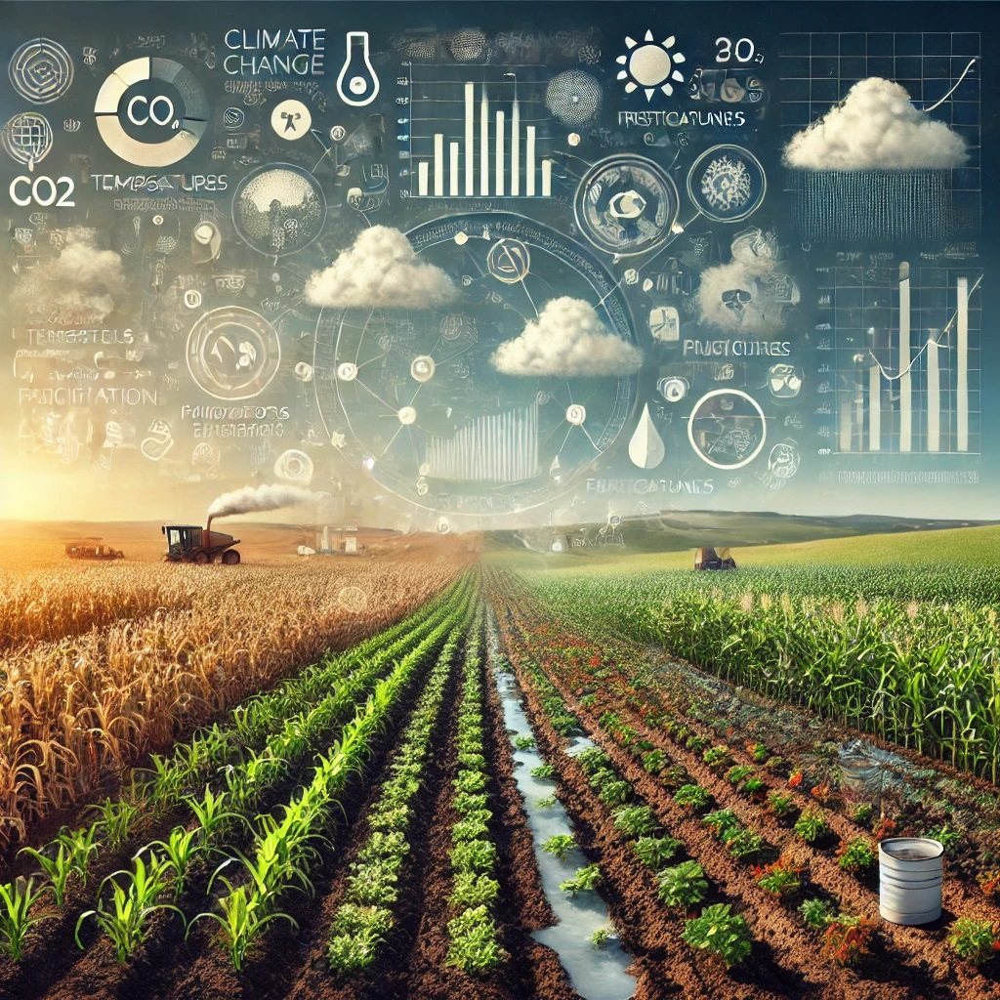

https://www.kaggle.com/datasets/waqi786/climate-change-impact-on-agriculture


---

# Climate Change Impact on Agriculture: Forecasting Crop Yields

## Introduction

Climate change poses significant challenges to global agriculture by altering weather patterns, temperature, precipitation levels, and the frequency of extreme weather events. Understanding how these factors impact crop yields is critical for ensuring food security and developing sustainable agricultural practices.

This analysis focuses on building forecasting models to predict future crop yields based on various environmental and economic factors such as average temperature, CO2 emissions, total precipitation, irrigation access, and pesticide use. By leveraging historical data from multiple regions and crop types, this study aims to provide actionable insights that can help farmers, policymakers, and researchers adapt to the changing climate.

The following sections will explore the dataset, conduct exploratory data analysis (EDA), and implement machine learning models to forecast crop yields under different climate change scenarios.

---


By: John Chilton

# Load default libararies

In [221]:
# Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Display settings
import warnings
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
sns.set(style='whitegrid')

# Set display options for larger datasets
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# Connect the Drive

In [222]:
from google.colab import drive
drive.mount('/content/drive') # Mount your local Google Drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load the Data File

In [223]:
df =pd.read_csv('/content/drive/MyDrive/lab_mount/climate_change_impact_on_agriculture_2024.csv')



*   Observations
*   Sanity Checks



In [224]:
df.head(10) # Checking the firsdt 10 rows

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72
5,2019,USA,Midwest,Coffee,17.19,975.13,10.73,2.180,5,52.45,26.06,71.56,97.32,Water Management,353.16
6,1997,Argentina,Northeast,Fruits,23.46,1816.41,27.70,1.611,2,20.22,0.56,28.72,79.09,Organic Farming,480.61
7,2021,Australia,New South Wales,Rice,25.63,786.17,7.77,3.270,4,66.53,13.44,40.50,63.16,Drought-resistant Crops,1367.97
8,2012,India,Punjab,Wheat,32.08,1233.10,6.10,2.990,1,45.87,10.09,32.54,42.31,Water Management,761.89
9,2018,Nigeria,North West,Barley,21.23,475.32,25.74,0.765,1,25.74,44.38,72.92,84.21,No Adaptation,167.21


In [225]:
df.tail(10) # Checking the last 10 rows

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
9990,2004,China,Central,Rice,16.17,2571.78,1.56,4.530,8,83.76,6.40,54.79,44.81,No Adaptation,981.05
9991,2016,China,East,Barley,-3.44,2997.57,20.18,1.197,6,99.98,30.65,87.87,55.42,Drought-resistant Crops,181.28
9992,1995,France,Grand Est,Soybeans,3.82,762.69,9.13,1.100,9,89.83,3.42,59.99,88.75,Organic Farming,227.30
9993,1990,France,Ile-de-France,Coffee,16.52,2102.28,16.42,2.448,0,51.34,44.54,79.02,91.99,No Adaptation,523.60
9994,2011,China,North,Coffee,15.26,2770.64,13.65,3.010,6,85.45,43.00,5.64,95.09,Water Management,1047.69
9995,2022,France,Nouvelle-Aquitaine,Cotton,30.48,685.93,17.64,3.033,9,27.56,41.96,10.95,43.41,No Adaptation,1483.06
9996,1999,Australia,Queensland,Soybeans,9.53,2560.38,10.68,2.560,4,77.02,5.45,82.32,59.39,No Adaptation,829.61
9997,2000,Argentina,Patagonia,Coffee,31.92,357.76,26.01,1.161,10,78.53,11.94,26.00,41.46,Water Management,155.99
9998,1996,Brazil,Southeast,Soybeans,13.95,1549.52,17.31,3.348,2,42.65,44.71,25.07,75.10,Crop Rotation,1613.90
9999,2015,China,South,Corn,11.78,1676.25,5.34,3.710,5,46.41,48.28,98.27,59.38,Water Management,453.14


In [226]:
df.info() # Checking the data types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Year                         10000 non-null  int64  
 1   Country                      10000 non-null  object 
 2   Region                       10000 non-null  object 
 3   Crop_Type                    10000 non-null  object 
 4   Average_Temperature_C        10000 non-null  float64
 5   Total_Precipitation_mm       10000 non-null  float64
 6   CO2_Emissions_MT             10000 non-null  float64
 7   Crop_Yield_MT_per_HA         10000 non-null  float64
 8   Extreme_Weather_Events       10000 non-null  int64  
 9   Irrigation_Access_%          10000 non-null  float64
 10  Pesticide_Use_KG_per_HA      10000 non-null  float64
 11  Fertilizer_Use_KG_per_HA     10000 non-null  float64
 12  Soil_Health_Index            10000 non-null  float64
 13  Adaptation_Strate

In [227]:
df.shape # Checking the shape of the data

(10000, 15)

In [228]:
df.describe() # Checking the summary statistics

,Year,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Economic_Impact_Million_USD
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,2007.088700,15.241299,1611.663834,15.246608,2.240017,4.980900,55.248332,24.955735,49.973708,64.901278,674.269658
std,10.084245,11.466955,805.016815,8.589423,0.998342,3.165808,25.988305,14.490962,28.711027,20.195882,414.591431
min,1990.000000,-4.990000,200.150000,0.500000,0.450000,0.000000,10.010000,0.000000,0.010000,30.000000,47.840000
25%,1999.000000,5.430000,925.697500,7.760000,1.449000,2.000000,32.677500,12.527500,25.390000,47.235000,350.545000
50%,2007.000000,15.175000,1611.160000,15.200000,2.170000,5.000000,55.175000,24.930000,49.635000,64.650000,583.920000
75%,2016.000000,25.340000,2306.997500,22.820000,2.930000,8.000000,77.582500,37.470000,74.825000,82.472500,917.505000
max,2024.000000,35.000000,2999.670000,30.000000,5.000000,10.000000,99.990000,49.990000,99.990000,100.000000,2346.470000


In [229]:
df.isnull().sum() # Checking for missing values

,0
Year,0
Country,0
Region,0
Crop_Type,0
Average_Temperature_C,0
Total_Precipitation_mm,0
CO2_Emissions_MT,0
Crop_Yield_MT_per_HA,0
Extreme_Weather_Events,0
Irrigation_Access_%,0


In [230]:
df.duplicated().sum() # Checking for duplicated values

0

In [231]:
df.nunique() # Checking the number of unique values

,0
Year,35
Country,10
Region,34
Crop_Type,10
Average_Temperature_C,3677
Total_Precipitation_mm,9784
CO2_Emissions_MT,2852
Crop_Yield_MT_per_HA,850
Extreme_Weather_Events,11
Irrigation_Access_%,6003


In [232]:
df.dtypes # Checking the data types

,0
Year,int64
Country,object
Region,object
Crop_Type,object
Average_Temperature_C,float64
Total_Precipitation_mm,float64
CO2_Emissions_MT,float64
Crop_Yield_MT_per_HA,float64
Extreme_Weather_Events,int64
Irrigation_Access_%,float64


In [233]:
df.columns # Checking the column names

Index(['Year', 'Country', 'Region', 'Crop_Type', 'Average_Temperature_C',
       'Total_Precipitation_mm', 'CO2_Emissions_MT', 'Crop_Yield_MT_per_HA',
       'Extreme_Weather_Events', 'Irrigation_Access_%',
       'Pesticide_Use_KG_per_HA', 'Fertilizer_Use_KG_per_HA',
       'Soil_Health_Index', 'Adaptation_Strategies',
       'Economic_Impact_Million_USD'],
      dtype='object')

In [234]:
df.describe().T # Checking the summary statistics

,count,mean,std,min,25%,50%,75%,max
Year,10000.0,2007.088700,10.084245,1990.00,1999.0000,2007.000,2016.0000,2024.00
Average_Temperature_C,10000.0,15.241299,11.466955,-4.99,5.4300,15.175,25.3400,35.00
Total_Precipitation_mm,10000.0,1611.663834,805.016815,200.15,925.6975,1611.160,2306.9975,2999.67
CO2_Emissions_MT,10000.0,15.246608,8.589423,0.50,7.7600,15.200,22.8200,30.00
Crop_Yield_MT_per_HA,10000.0,2.240017,0.998342,0.45,1.4490,2.170,2.9300,5.00
Extreme_Weather_Events,10000.0,4.980900,3.165808,0.00,2.0000,5.000,8.0000,10.00
Irrigation_Access_%,10000.0,55.248332,25.988305,10.01,32.6775,55.175,77.5825,99.99
Pesticide_Use_KG_per_HA,10000.0,24.955735,14.490962,0.00,12.5275,24.930,37.4700,49.99
Fertilizer_Use_KG_per_HA,10000.0,49.973708,28.711027,0.01,25.3900,49.635,74.8250,99.99
Soil_Health_Index,10000.0,64.901278,20.195882,30.00,47.2350,64.650,82.4725,100.00


In [235]:
df['Country']

,Country
0,India
1,China
2,France
3,Canada
4,India
...,...
9995,France
9996,Australia
9997,Argentina
9998,Brazil


In [236]:
# Viewing unique values in the 'Country' column
df['Country'].unique()

array(['India', 'China', 'France', 'Canada', 'USA', 'Argentina',
       'Australia', 'Nigeria', 'Russia', 'Brazil'], dtype=object)

In [237]:
df['Region']

,Region
0,West Bengal
1,North
2,Ile-de-France
3,Prairies
4,Tamil Nadu
...,...
9995,Nouvelle-Aquitaine
9996,Queensland
9997,Patagonia
9998,Southeast


In [238]:
df['Country'].isnull().sum() # Checking for Missing Values in the column

0

In [239]:
df['Region'].isnull().sum() # Checking for Missing Values in the column

0

In [240]:
# Filter the dataset to view rows where 'Country' is 'India'
india_data = df[df['Country'] == 'India']

# Display the first few rows of the filtered data
india_data.head()

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72
8,2012,India,Punjab,Wheat,32.08,1233.10,6.10,2.990,1,45.87,10.09,32.54,42.31,Water Management,761.89
21,2016,India,West Bengal,Soybeans,14.00,1240.49,29.18,4.032,9,29.32,37.80,99.09,46.32,No Adaptation,1745.39
51,2007,India,West Bengal,Vegetables,27.45,784.04,5.55,2.600,6,89.47,28.15,86.71,33.12,Water Management,308.77


In [241]:
df # Viewing the entire Data Frame

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2022,France,Nouvelle-Aquitaine,Cotton,30.48,685.93,17.64,3.033,9,27.56,41.96,10.95,43.41,No Adaptation,1483.06
9996,1999,Australia,Queensland,Soybeans,9.53,2560.38,10.68,2.560,4,77.02,5.45,82.32,59.39,No Adaptation,829.61
9997,2000,Argentina,Patagonia,Coffee,31.92,357.76,26.01,1.161,10,78.53,11.94,26.00,41.46,Water Management,155.99
9998,1996,Brazil,Southeast,Soybeans,13.95,1549.52,17.31,3.348,2,42.65,44.71,25.07,75.10,Crop Rotation,1613.90


In [242]:
df['Average_Temperature_C'] # Checking the Average_Temperature_C Column

,Average_Temperature_C
0,1.55
1,3.23
2,21.11
3,27.85
4,2.19
...,...
9995,30.48
9996,9.53
9997,31.92
9998,13.95


In [243]:
df['Average_Temperature_C'].isnull().sum() # Checking for Missing Values in the Column

0

In [244]:
df['Average_Temperature_C'].unique() # Checking the Unique Values in the Column

array([ 1.55,  3.23, 21.11, ..., -3.09, 14.24,  9.53])

In [245]:
df['Average_Temperature_C'].mean() # Checking the Mean of the Column

15.241299

In [246]:
df['Economic_Impact_Million_USD'] # Checking the Economic_Impact_Million_USD Column

,Economic_Impact_Million_USD
0,808.13
1,616.22
2,796.96
3,790.32
4,401.72
...,...
9995,1483.06
9996,829.61
9997,155.99
9998,1613.90


In [247]:
df['Economic_Impact_Million_USD'].isnull().sum() # Checking for Missing Values in the Column

0

In [248]:
df['Economic_Impact_Million_USD'].unique() # Checking the Unique Values in the Column

array([ 808.13,  616.22,  796.96, ...,  155.99, 1613.9 ,  453.14])

In [249]:
df['Economic_Impact_Million_USD'].mean() # Checking the Mean of the Column

674.269658

In [250]:
# Creating a backup of the DataFrame
df_backup = df.copy()

# Verify by displaying the first few rows of the backup
df_backup.head()

,Year,Country,Region,Crop_Type,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Adaptation_Strategies,Economic_Impact_Million_USD
0,2001,India,West Bengal,Corn,1.55,447.06,15.22,1.737,8,14.54,10.08,14.78,83.25,Water Management,808.13
1,2024,China,North,Corn,3.23,2913.57,29.82,1.737,8,11.05,33.06,23.25,54.02,Crop Rotation,616.22
2,2001,France,Ile-de-France,Wheat,21.11,1301.74,25.75,1.719,5,84.42,27.41,65.53,67.78,Water Management,796.96
3,2001,Canada,Prairies,Coffee,27.85,1154.36,13.91,3.890,5,94.06,14.38,87.58,91.39,No Adaptation,790.32
4,1998,India,Tamil Nadu,Sugarcane,2.19,1627.48,11.81,1.080,9,95.75,44.35,88.08,49.61,Crop Rotation,401.72


---

## Exploratory Data Analysis (EDA)

Now that the dataset has been successfully loaded and backed up, we will proceed with exploratory data analysis (EDA) to better understand the relationships between the variables and their potential impact on crop yield. This step is crucial for identifying trends, outliers, and correlations that will guide the selection of features for our forecasting models.

In this section, we will:
1. **Examine the structure of the dataset** by checking the distribution of key features such as temperature, precipitation, and crop yield.
2. **Visualize the data** to detect patterns and anomalies that may influence model performance.
3. **Check for missing values** and understand how they may affect the analysis.

The results from this EDA will inform our feature engineering and model-building steps.

---


# Functions to view the Data Set

In [251]:
# Function to visualize univariate distributions (histogram)
def plot_univariate_histogram(df, column):
    plt.figure(figsize=(8, 6))
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

# Function to visualize univariate distributions (boxplot)
def plot_univariate_boxplot(df, column):
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

# Function to visualize bivariate relationships (scatter plot)
def plot_bivariate_scatter(df, column1, column2):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=column1, y=column2, data=df)
    plt.title(f'Relationship between {column1} and {column2}')
    plt.xlabel(column1)
    plt.ylabel(column2)
    plt.show()

# Function to visualize bivariate relationships (heatmap)
def plot_bivariate_heatmap(df, columns):
    plt.figure(figsize=(10, 8))
    correlation_matrix = df[columns].corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Heatmap of Correlations')
    plt.show()

# Univariate Analysis

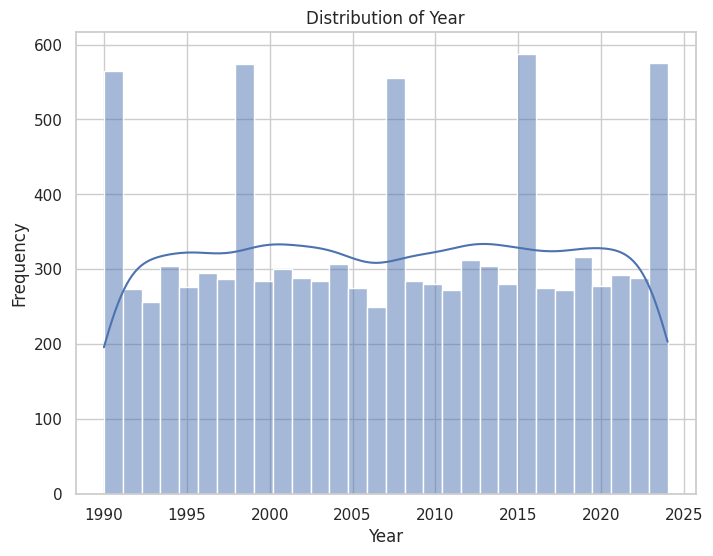

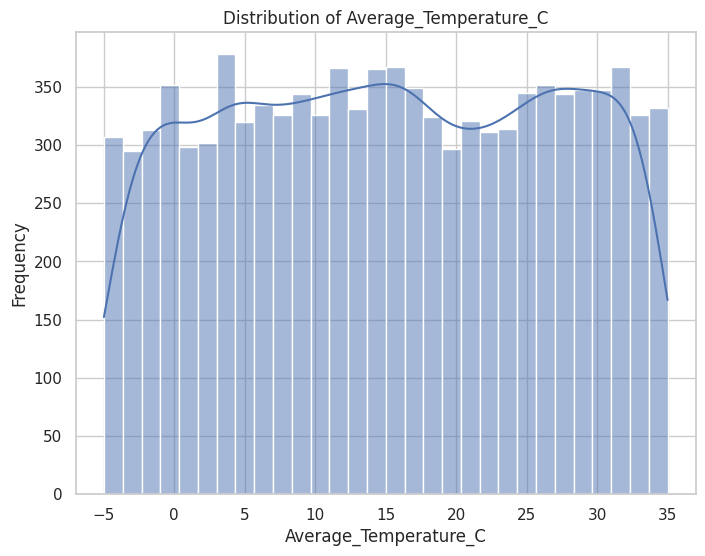

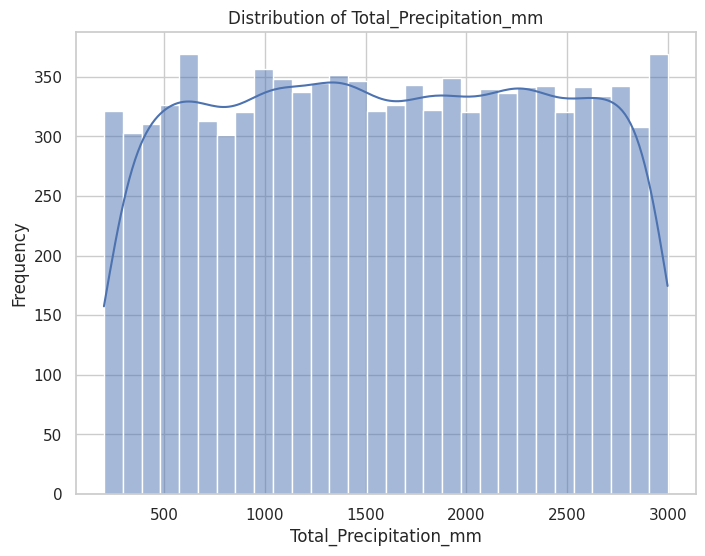

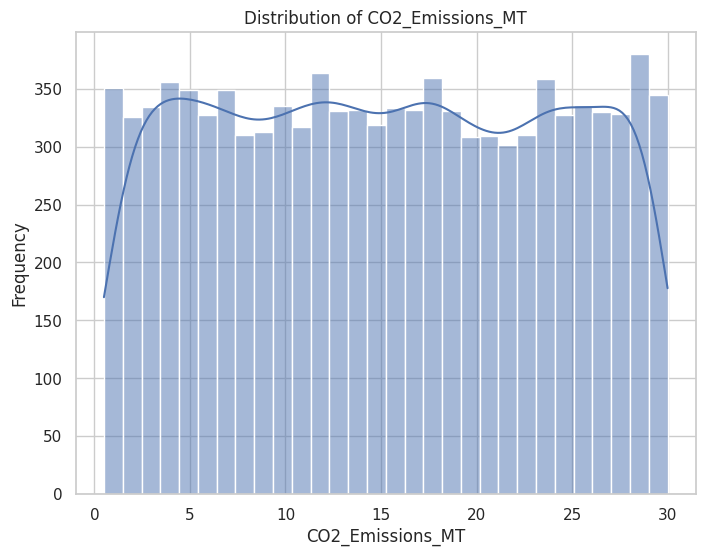

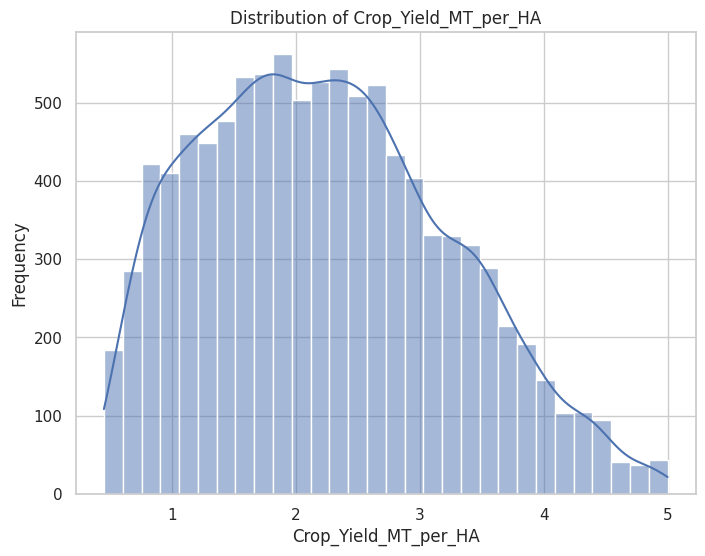

...

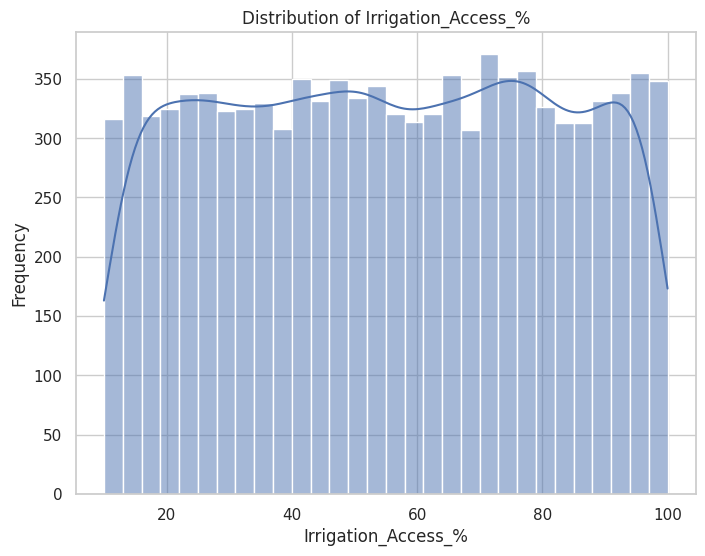

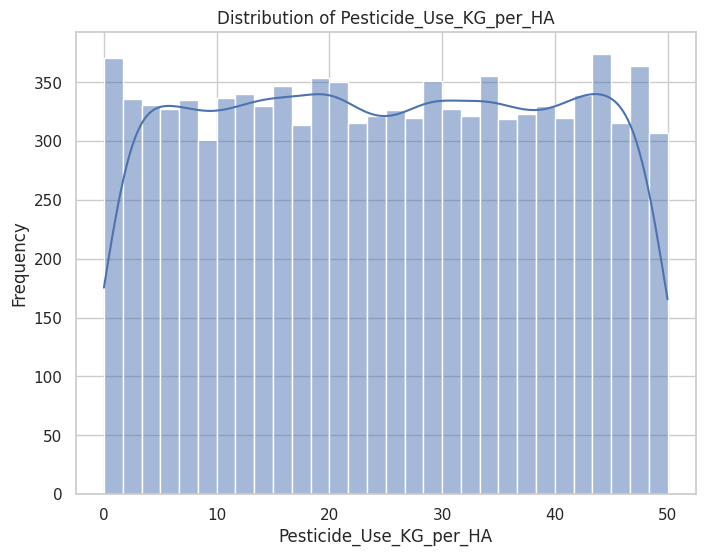

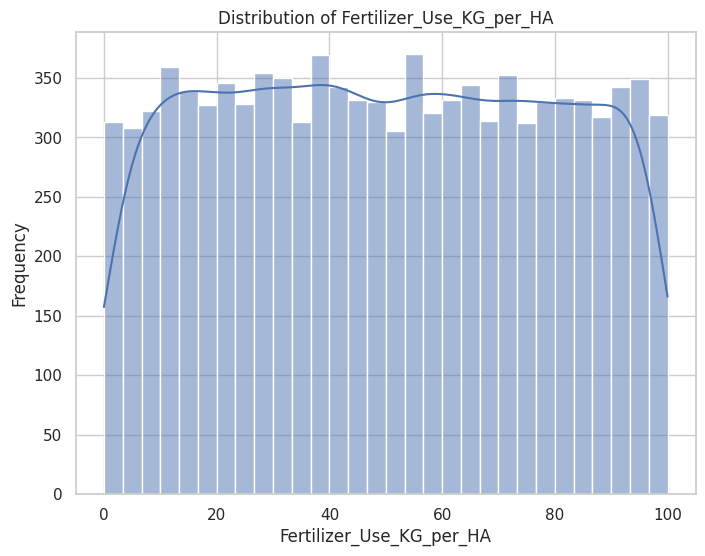

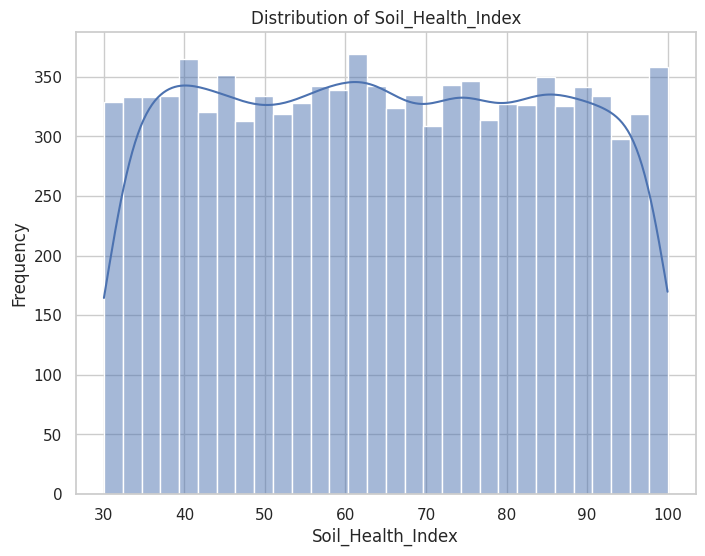

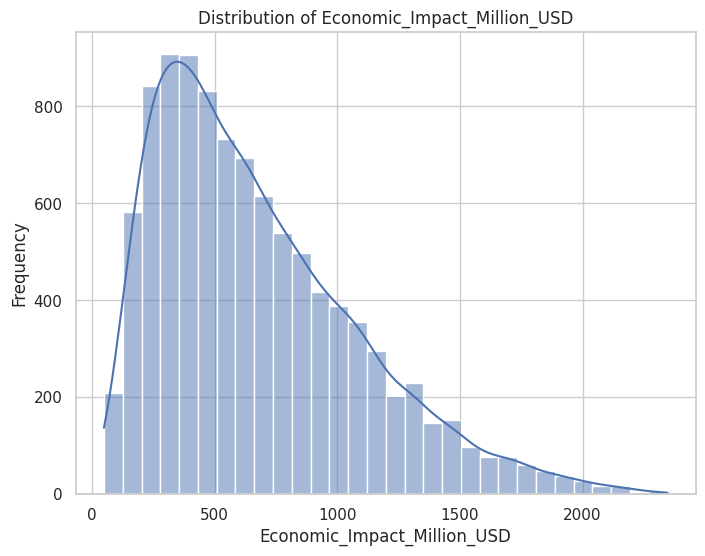

In [252]:
columns_to_analyze = [
    'Year', 'Average_Temperature_C', 'Total_Precipitation_mm', 'CO2_Emissions_MT',
    'Crop_Yield_MT_per_HA', 'Extreme_Weather_Events', 'Irrigation_Access_%',
    'Pesticide_Use_KG_per_HA', 'Fertilizer_Use_KG_per_HA', 'Soil_Health_Index',
    'Economic_Impact_Million_USD'
]

# Creating univariate histograms for each of the selected columns
for column in columns_to_analyze:
    plot_univariate_histogram(df, column)

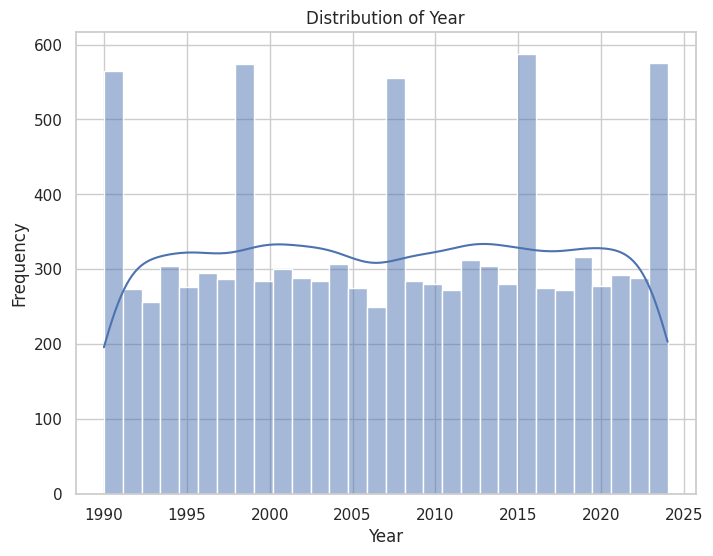

In [253]:
# Visualize the distribution of the 'Year' column
plot_univariate_histogram(df, 'Year')

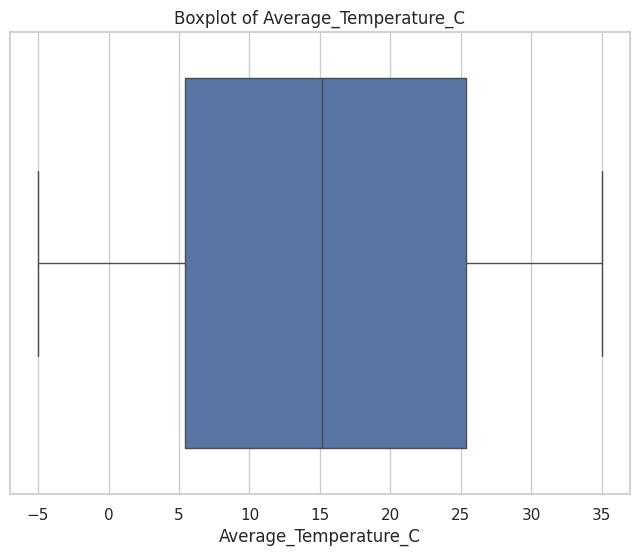

In [254]:
plot_univariate_boxplot(df, 'Average_Temperature_C') # Boxplot of Average_Temperature_C

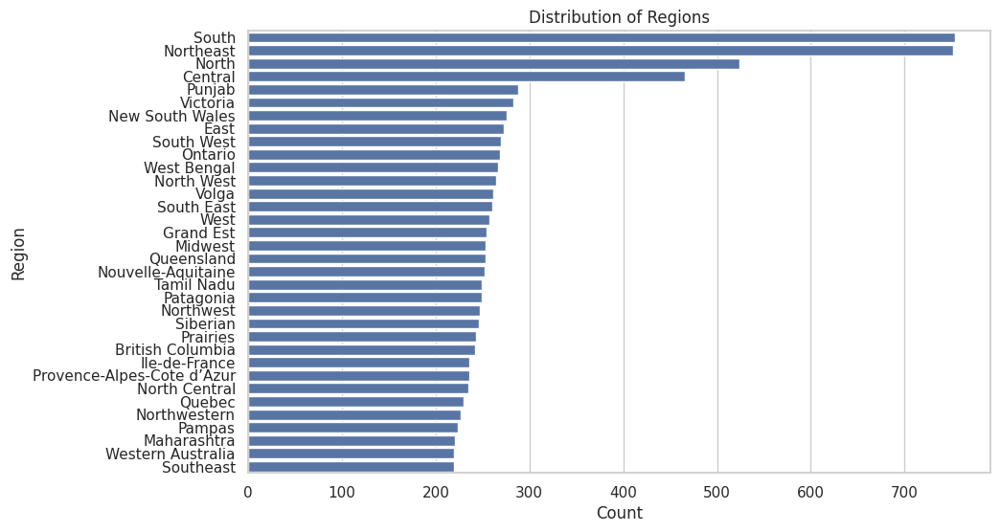

In [255]:
# Visualize the distribution of the 'Region' column using a count plot
plt.figure(figsize=(10, 6))
sns.countplot(y='Region', data=df, order=df['Region'].value_counts().index)
plt.title('Distribution of Regions')
plt.xlabel('Count')
plt.ylabel('Region')
plt.show()

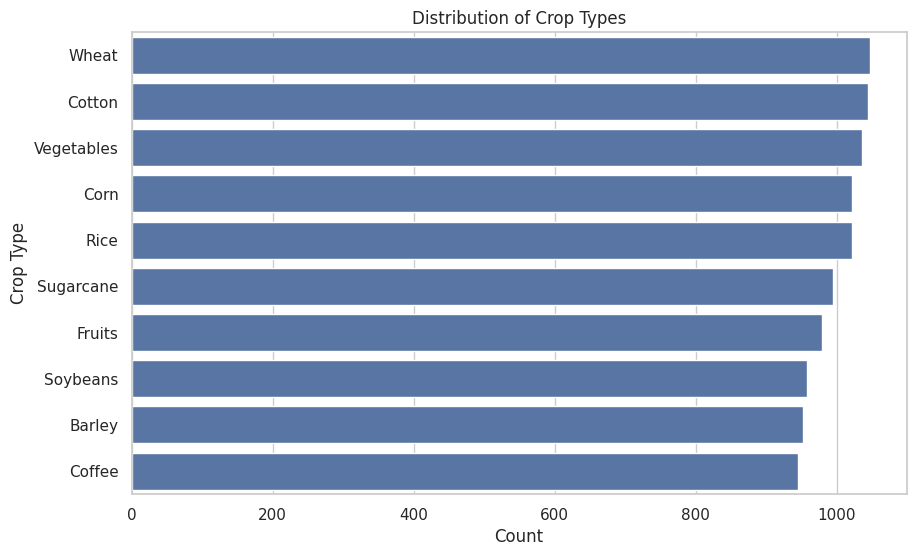

In [256]:
# Visualize the distribution of the 'Crop_Type' column using a count plot
plt.figure(figsize=(10, 6))
sns.countplot(y='Crop_Type', data=df, order=df['Crop_Type'].value_counts().index)
plt.title('Distribution of Crop Types')
plt.xlabel('Count')
plt.ylabel('Crop Type')
plt.show()

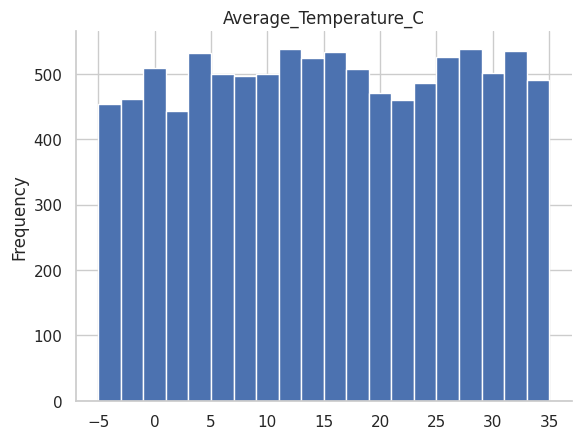

In [257]:
# @title Average_Temperature_C

from matplotlib import pyplot as plt
df['Average_Temperature_C'].plot(kind='hist', bins=20, title='Average_Temperature_C')
plt.gca().spines[['top', 'right',]].set_visible(False)

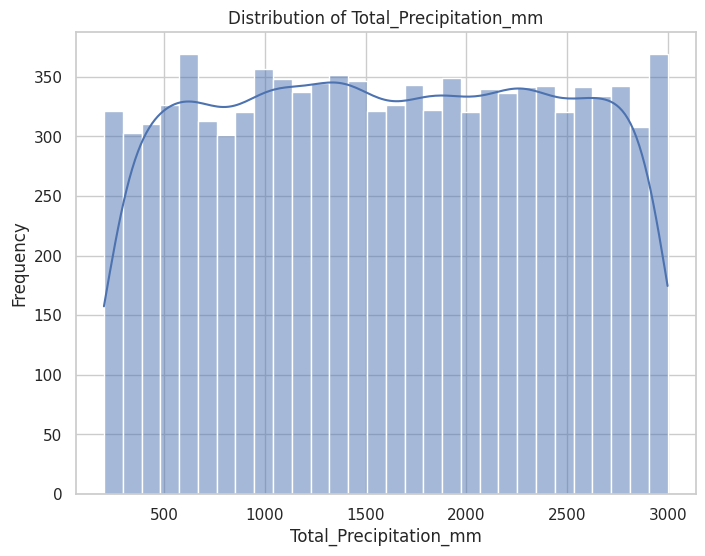

In [258]:
# Visualize the distribution of the 'Total_Precipitation_mm' column
plot_univariate_histogram(df, 'Total_Precipitation_mm')

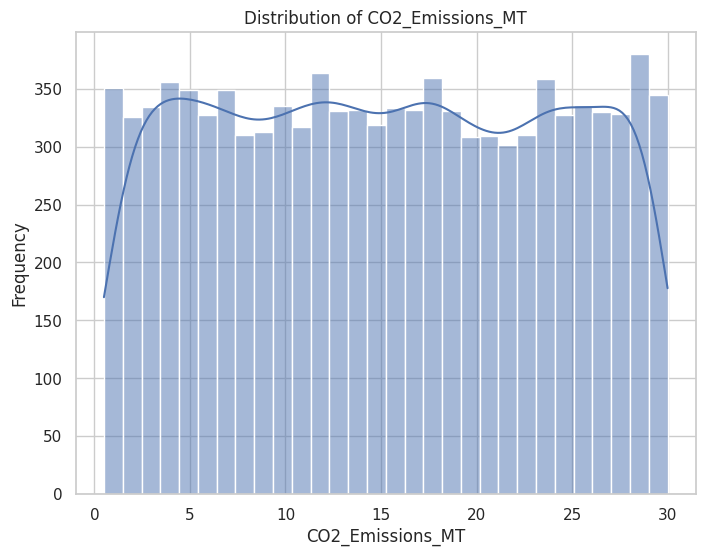

In [259]:
# Visualize the distribution of the 'CO2_Emissions_MT' column
plot_univariate_histogram(df, 'CO2_Emissions_MT')

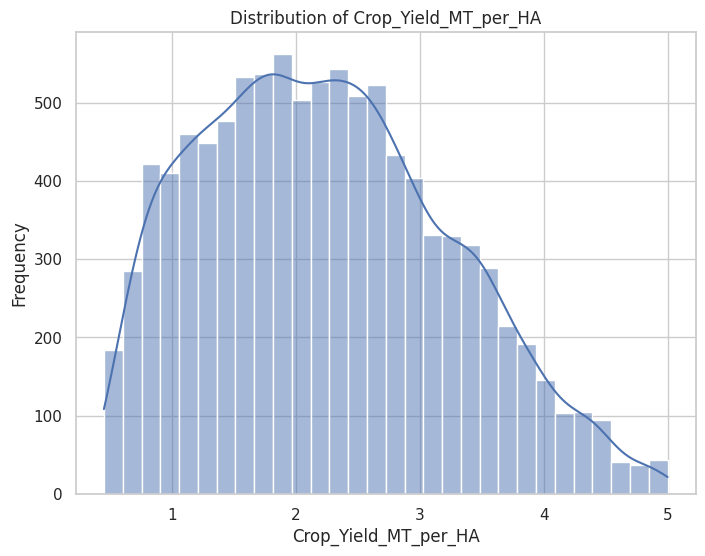

In [260]:
# Visualize the distribution of the 'Crop_Yield_MT_per_HA' column
plot_univariate_histogram(df, 'Crop_Yield_MT_per_HA')

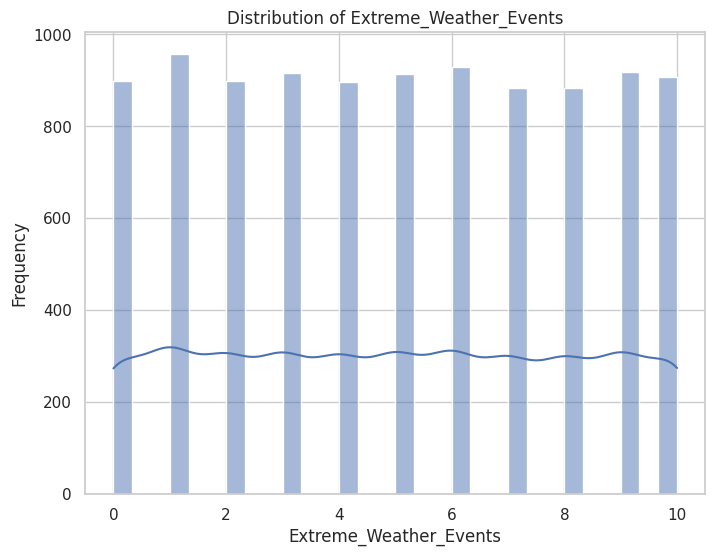

In [261]:
# Visualize the distribution of the 'Extreme_Weather_Events' column
plot_univariate_histogram(df, 'Extreme_Weather_Events')

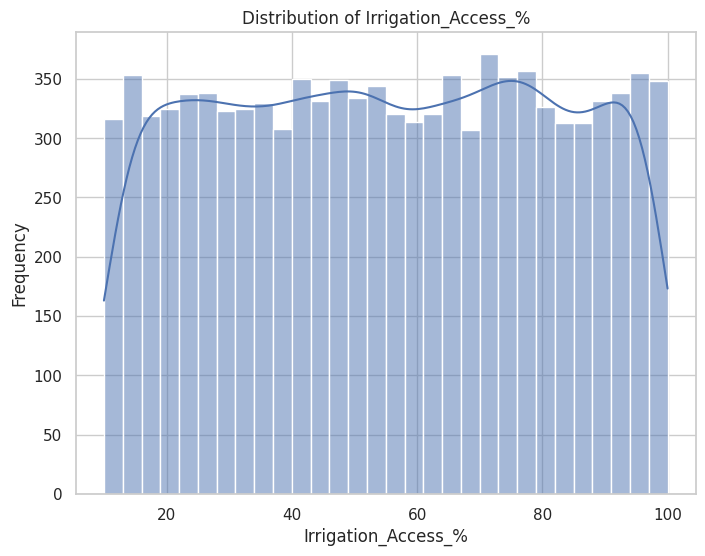

In [262]:
# Visualize the distribution of the 'Irrigation_Access_%' column
plot_univariate_histogram(df, 'Irrigation_Access_%')

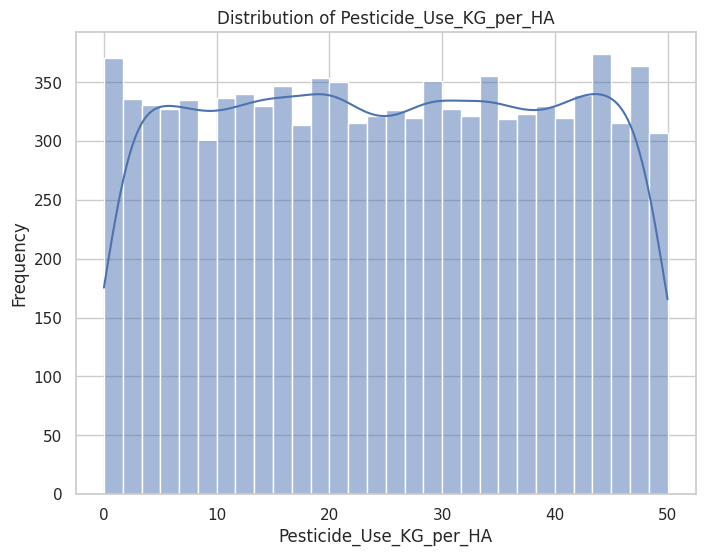

In [263]:
# Visualize the distribution of the 'Pesticide_Use_KG_per_HA' column
plot_univariate_histogram(df, 'Pesticide_Use_KG_per_HA')

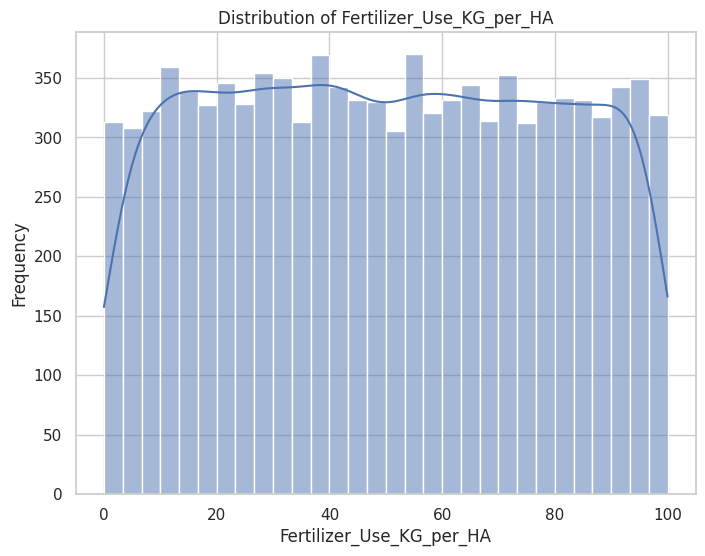

In [264]:
# Visualize the distribution of the 'Fertilizer_Use_KG_per_HA' column
plot_univariate_histogram(df, 'Fertilizer_Use_KG_per_HA')

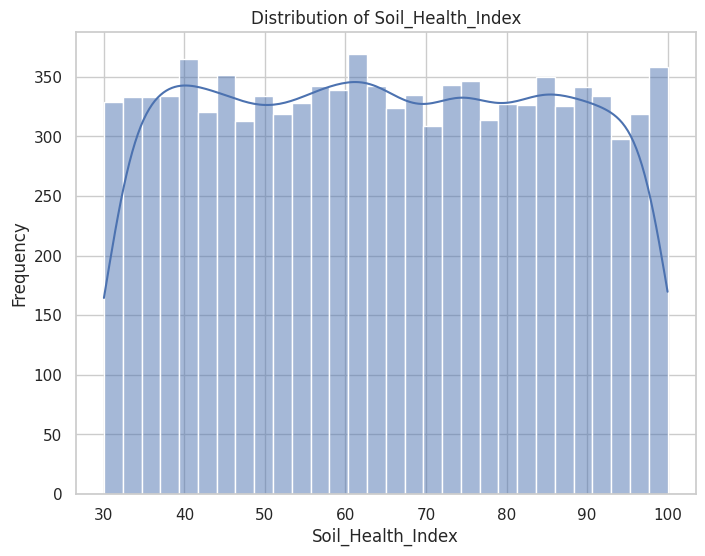

In [265]:
# Visualize the distribution of the 'Soil_Health_Index' column
plot_univariate_histogram(df, 'Soil_Health_Index')

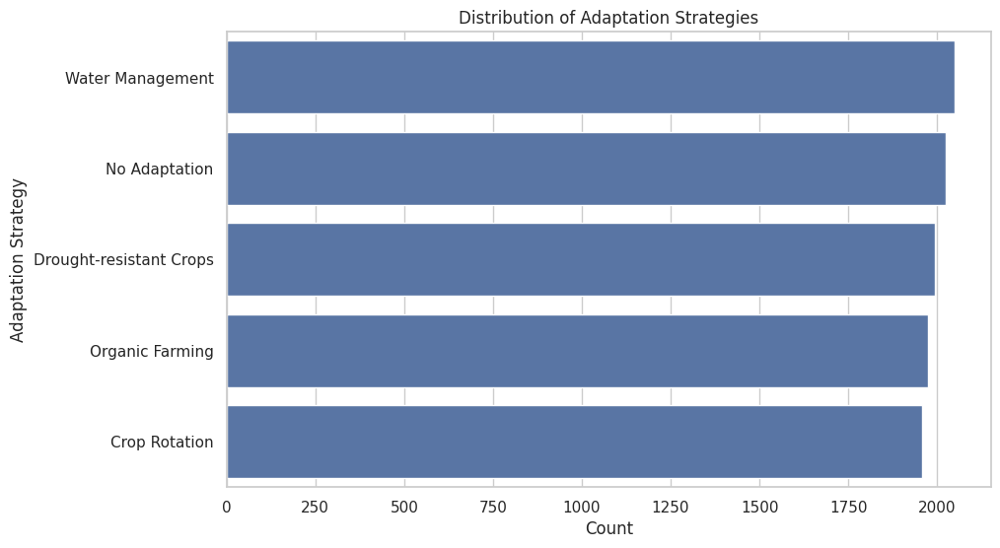

In [266]:
# Visualize the distribution of the 'Adaptation_Strategies' column using a count plot
plt.figure(figsize=(10, 6))
sns.countplot(y='Adaptation_Strategies', data=df, order=df['Adaptation_Strategies'].value_counts().index)
plt.title('Distribution of Adaptation Strategies')
plt.xlabel('Count')
plt.ylabel('Adaptation Strategy')
plt.show()

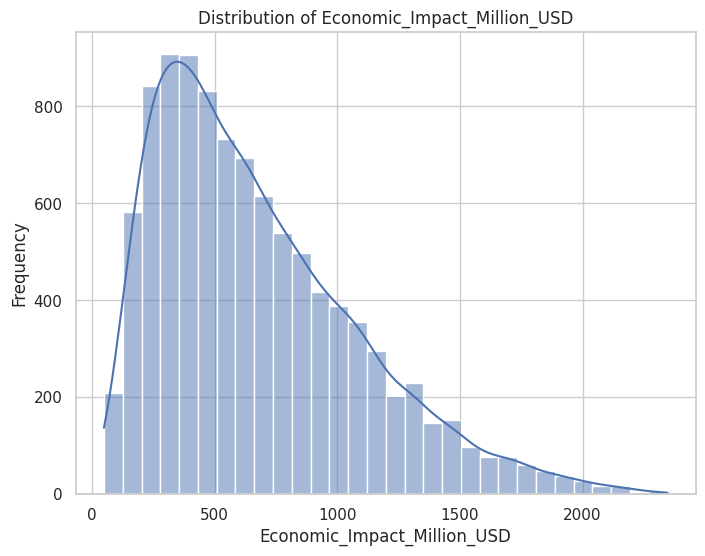

In [267]:
# Visualize the distribution of the 'Economic_Impact_Million_USD' column
plot_univariate_histogram(df, 'Economic_Impact_Million_USD')

# BiVariate Analysis

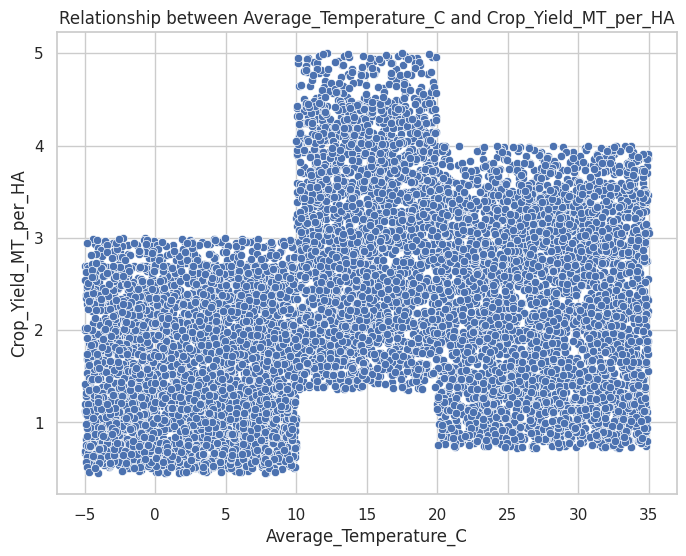

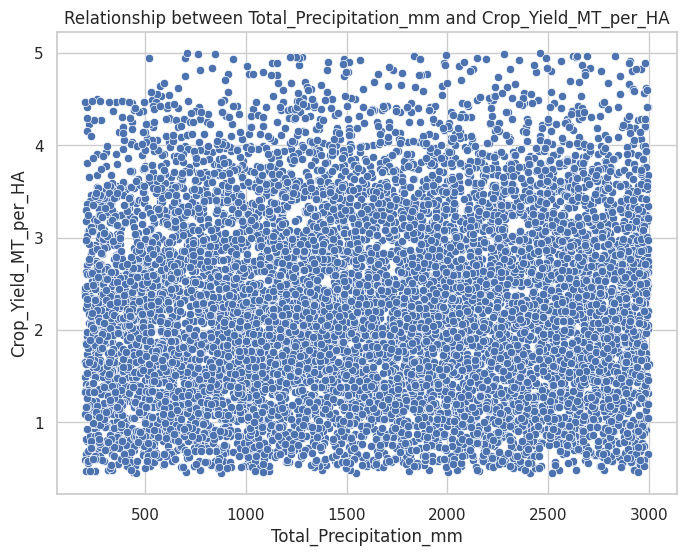

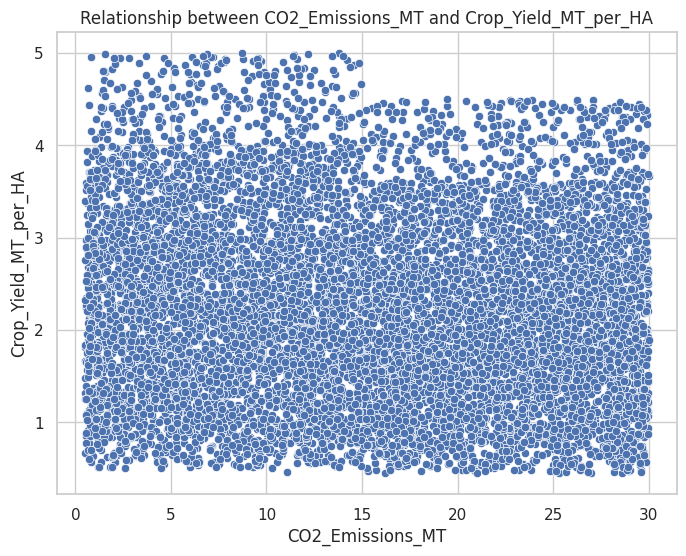

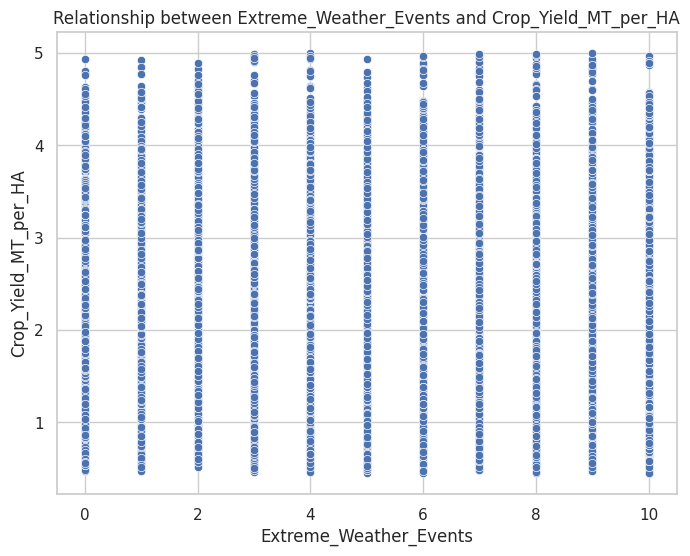

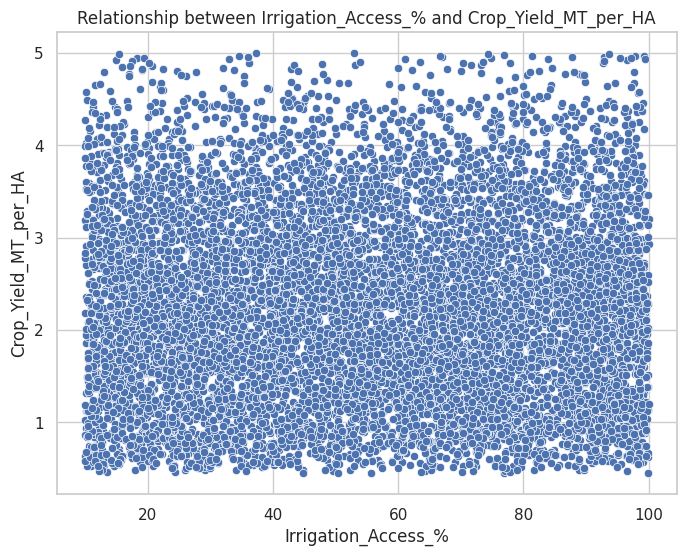

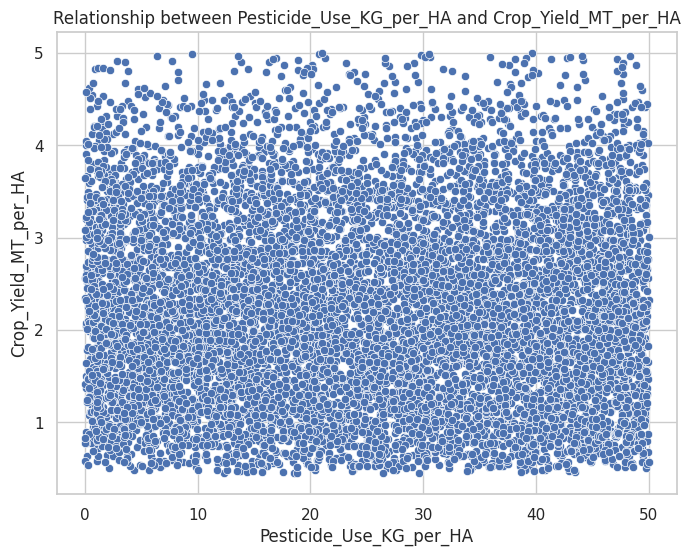

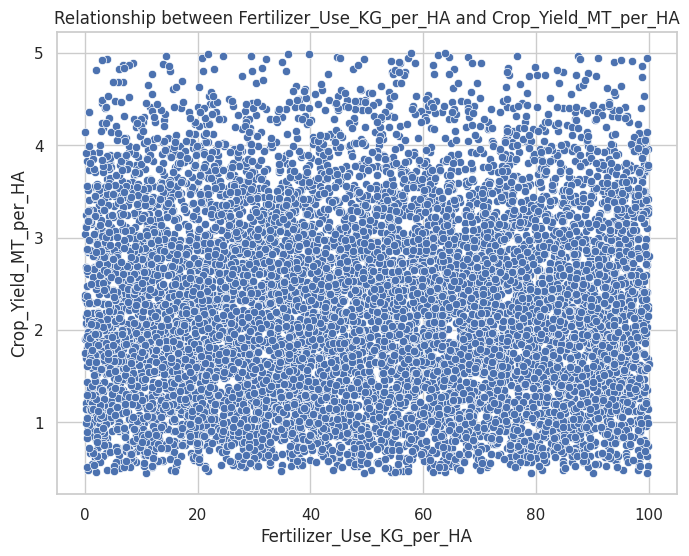

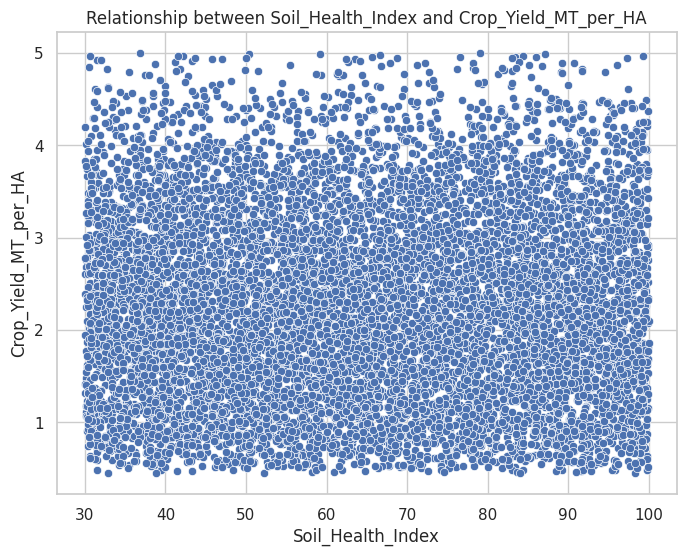

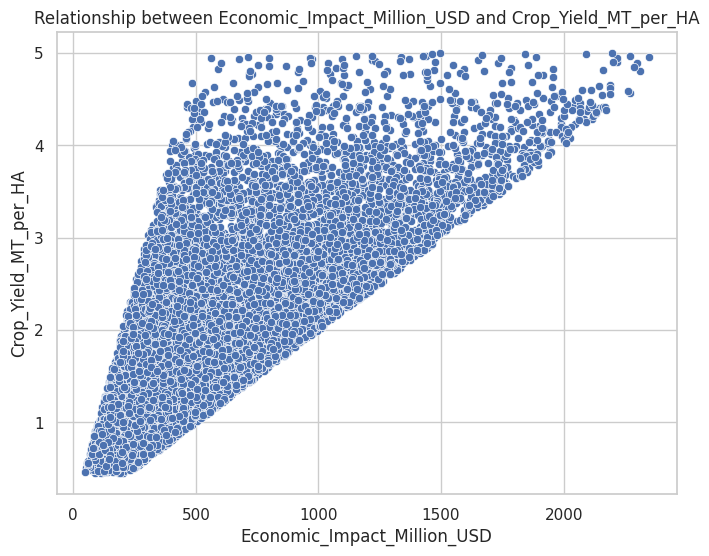

In [268]:
# Bivariate scatter plots for numeric features against the target variable 'Crop_Yield_MT_per_HA'

# List of numerical columns for bivariate analysis
bivariate_columns = [
    'Average_Temperature_C', 'Total_Precipitation_mm', 'CO2_Emissions_MT',
    'Extreme_Weather_Events', 'Irrigation_Access_%', 'Pesticide_Use_KG_per_HA',
    'Fertilizer_Use_KG_per_HA', 'Soil_Health_Index', 'Economic_Impact_Million_USD'
]

# Plotting scatter plots for each feature against 'Crop_Yield_MT_per_HA'
for column in bivariate_columns:
    plot_bivariate_scatter(df, column, 'Crop_Yield_MT_per_HA')

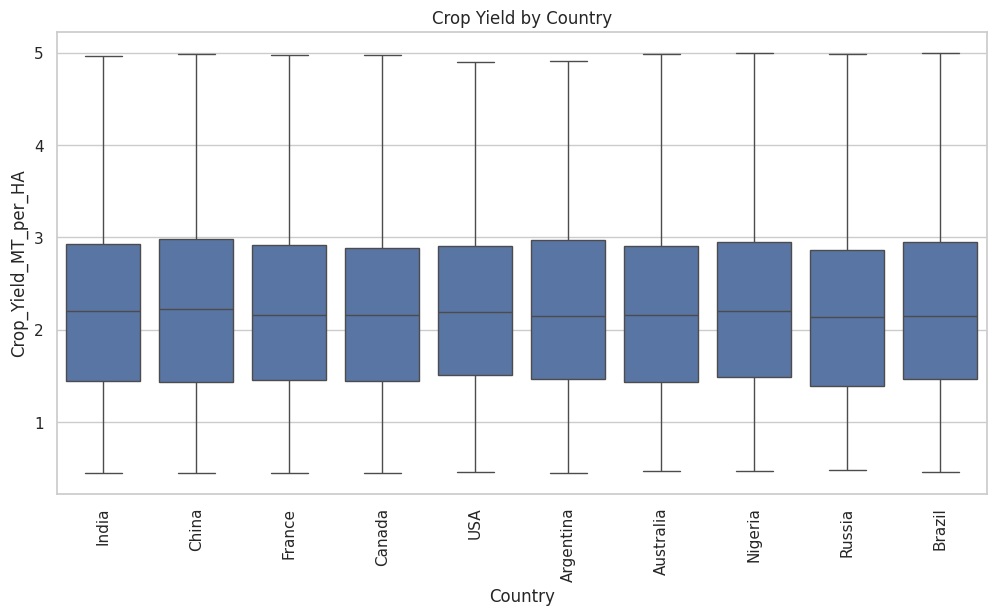

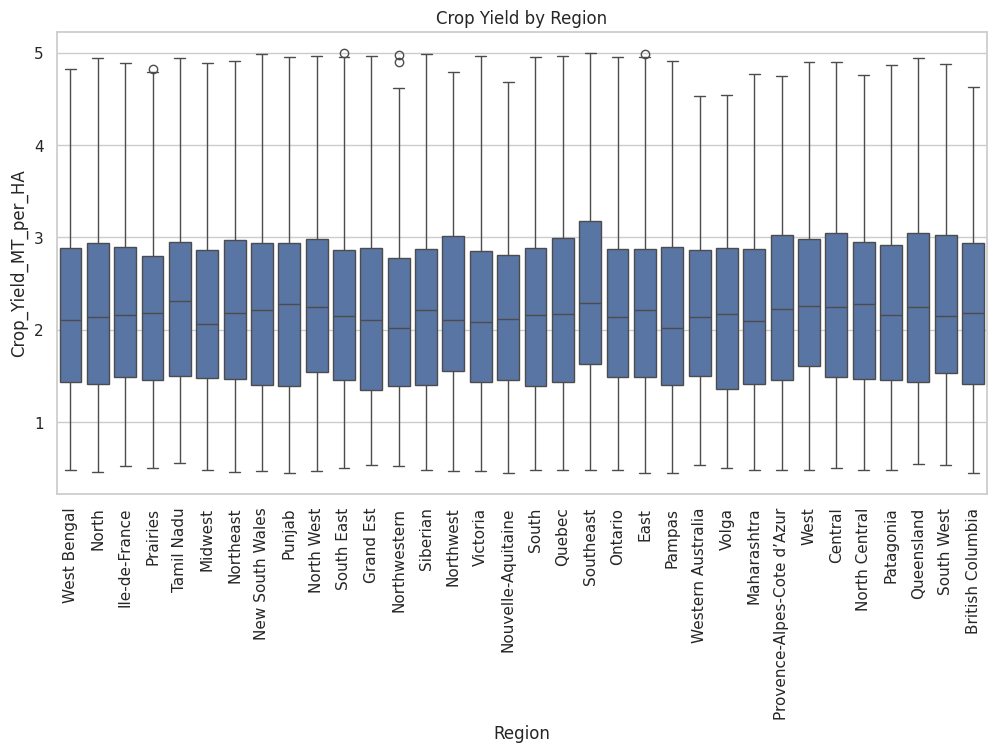

In [269]:
# Box plot to show the distribution of 'Crop_Yield_MT_per_HA' by 'Country'
plt.figure(figsize=(12, 6))
sns.boxplot(x='Country', y='Crop_Yield_MT_per_HA', data=df)
plt.title('Crop Yield by Country')
plt.xticks(rotation=90)
plt.show()

# Box plot to show the distribution of 'Crop_Yield_MT_per_HA' by 'Region'
plt.figure(figsize=(12, 6))
sns.boxplot(x='Region', y='Crop_Yield_MT_per_HA', data=df)
plt.title('Crop Yield by Region')
plt.xticks(rotation=90)
plt.show()

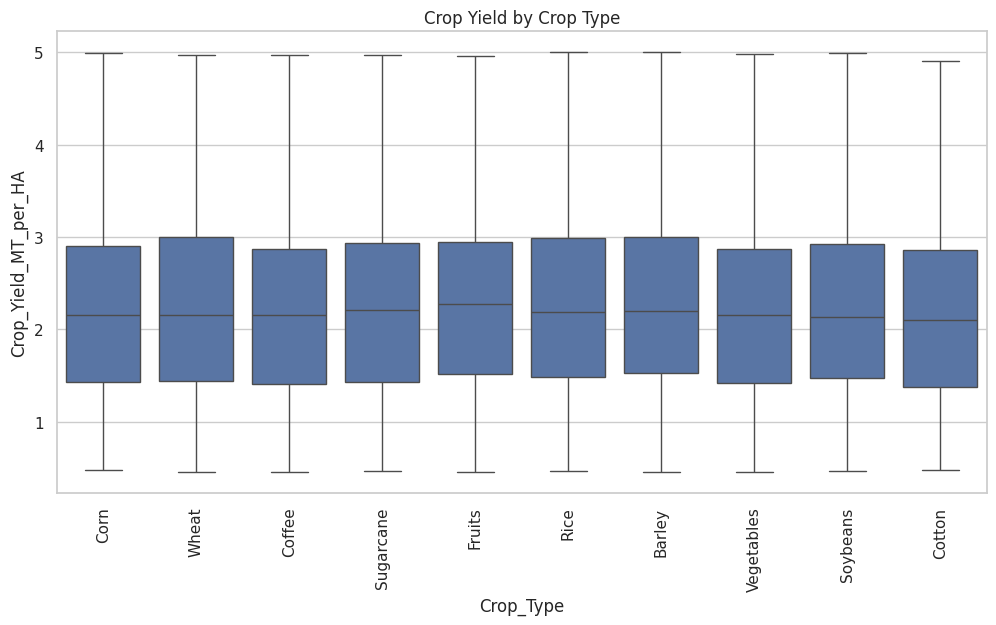

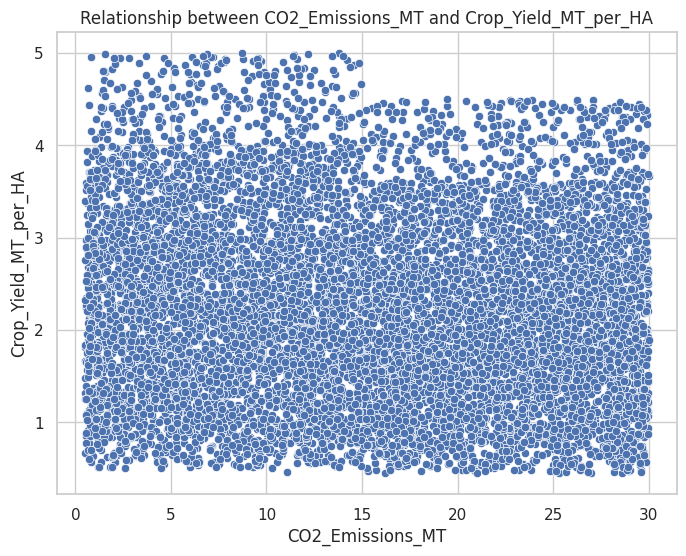

In [270]:
# Box plot to show the distribution of 'Crop_Yield_MT_per_HA' by 'Crop_Type'
plt.figure(figsize=(12, 6))
sns.boxplot(x='Crop_Type', y='Crop_Yield_MT_per_HA', data=df)
plt.title('Crop Yield by Crop Type')
plt.xticks(rotation=90)
plt.show()

# Scatter plot to show the relationship between 'CO2_Emissions_MT' and 'Crop_Yield_MT_per_HA'
plot_bivariate_scatter(df, 'CO2_Emissions_MT', 'Crop_Yield_MT_per_HA')

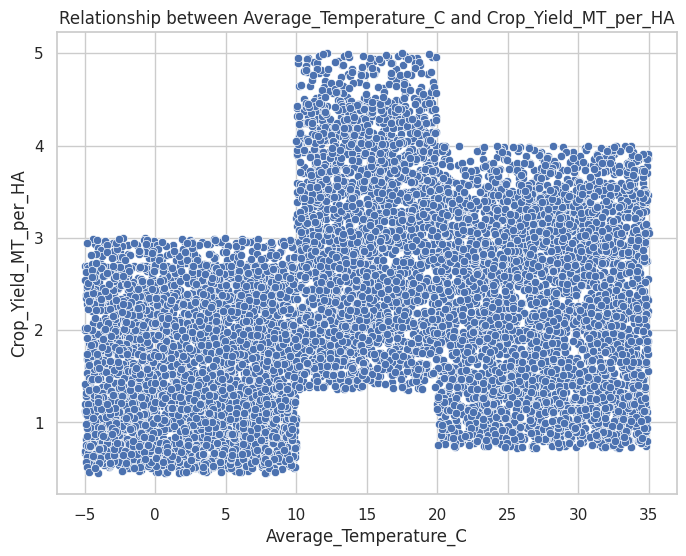

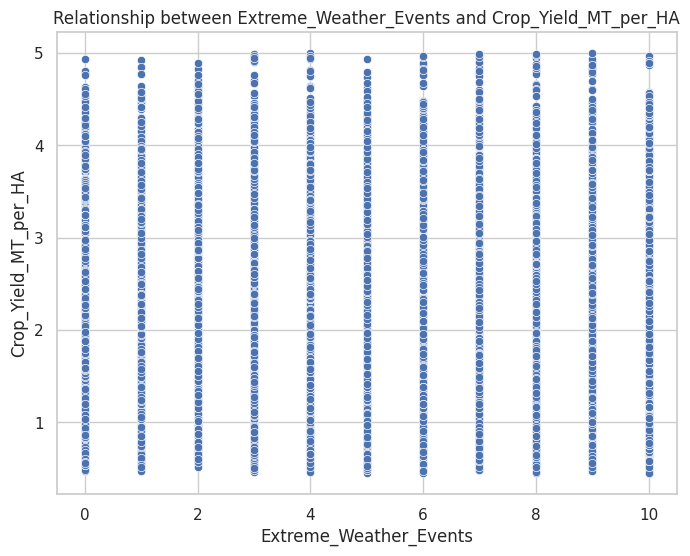

In [271]:
# Scatter plot to show the relationship between 'Average_Temperature_C' and 'Crop_Yield_MT_per_HA'
plot_bivariate_scatter(df, 'Average_Temperature_C', 'Crop_Yield_MT_per_HA')

# Scatter plot to show the relationship between 'Extreme_Weather_Events' and 'Crop_Yield_MT_per_HA'
plot_bivariate_scatter(df, 'Extreme_Weather_Events', 'Crop_Yield_MT_per_HA')

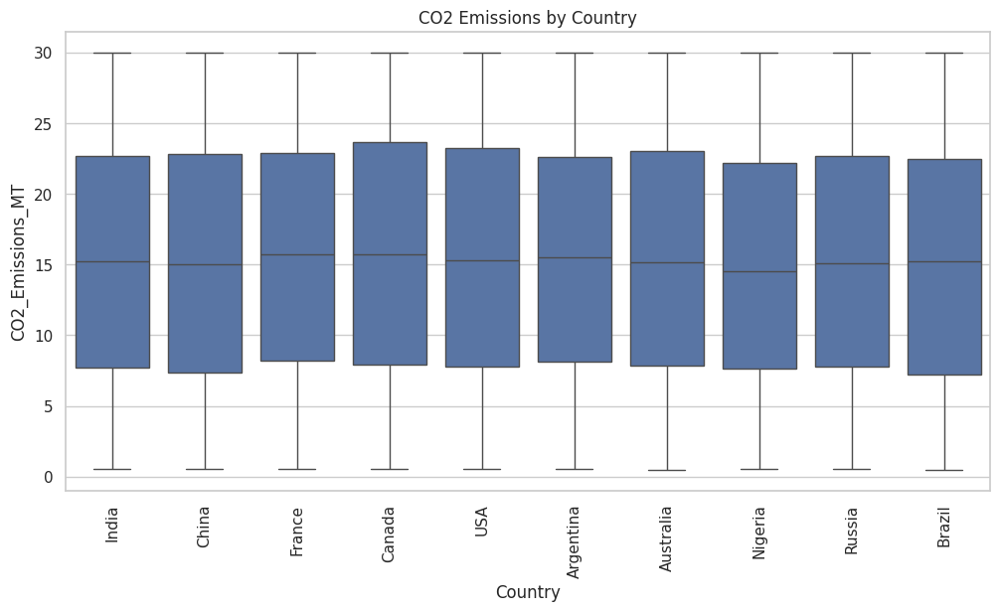

In [272]:
# Box plot to show the distribution of 'CO2_Emissions_MT' by 'Country'
plt.figure(figsize=(12, 6))
sns.boxplot(x='Country', y='CO2_Emissions_MT', data=df)
plt.title('CO2 Emissions by Country')
plt.xticks(rotation=90)
plt.show()

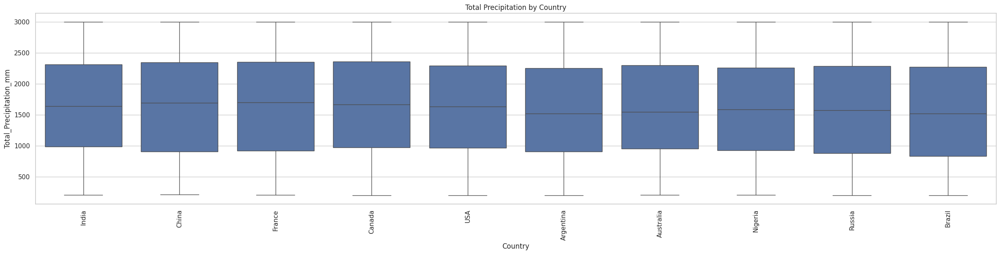

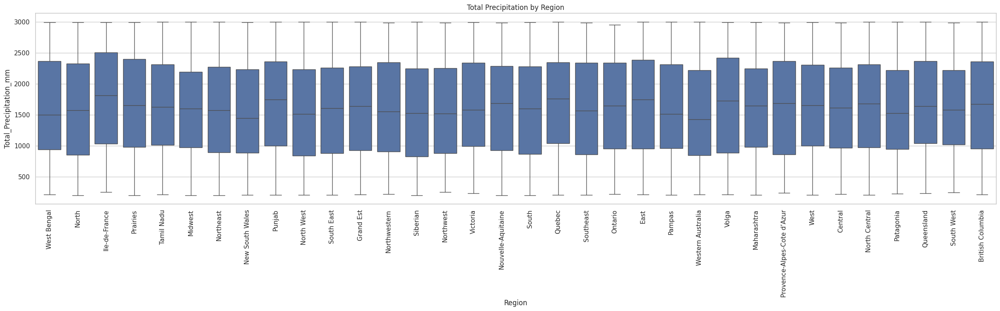

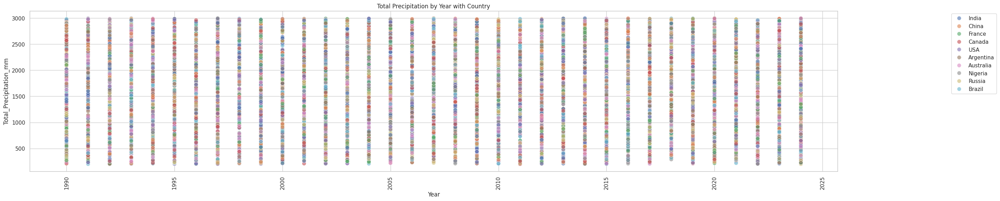

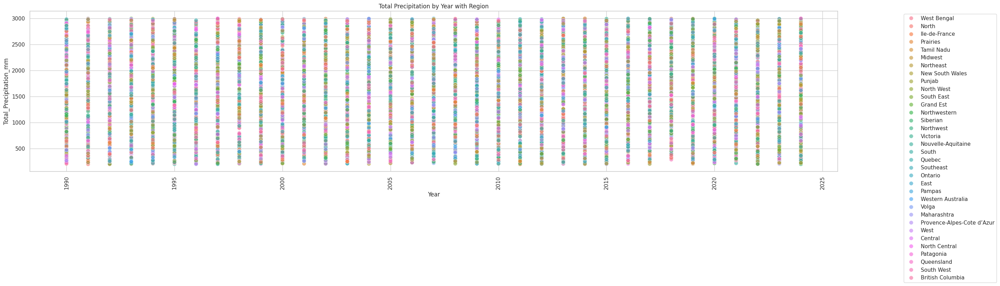

In [273]:
# Box plot to show the distribution of 'Total_Precipitation_mm' by 'Country'
plt.figure(figsize=(30, 6))
sns.boxplot(x='Country', y='Total_Precipitation_mm', data=df)
plt.title('Total Precipitation by Country')
plt.xticks(rotation=90)
plt.show()

# Box plot to show the distribution of 'Total_Precipitation_mm' by 'Region' with jitter
plt.figure(figsize=(30, 6))
sns.boxplot(x='Region', y='Total_Precipitation_mm', data=df)
plt.title('Total Precipitation by Region')
plt.xticks(rotation=90)
plt.show()

# Scatter plot for 'Year' and 'Total_Precipitation_mm' with hue for Country
plt.figure(figsize=(30, 6))
sns.scatterplot(x='Year', y='Total_Precipitation_mm', data=df, hue='Country', alpha=0.6, s=70)
plt.title('Total Precipitation by Year with Country')
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

# Scatter plot for 'Year' and 'Total_Precipitation_mm' with hue for Region
plt.figure(figsize=(30, 6))
sns.scatterplot(x='Year', y='Total_Precipitation_mm', data=df, hue='Region', alpha=0.6, s=70)
plt.title('Total Precipitation by Year with Region')
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

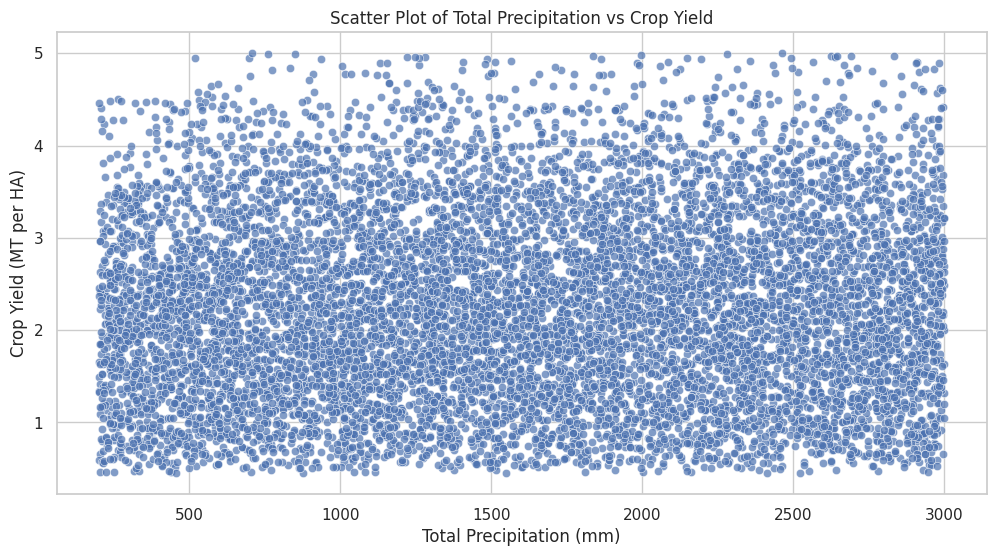

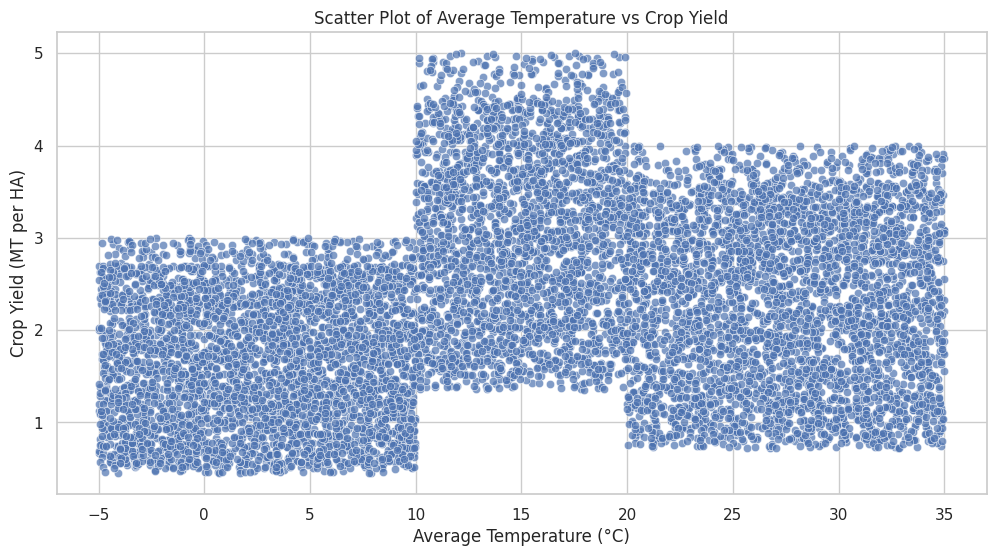

In [274]:
# Scatter plot for the entire dataset using 'Crop_Yield_MT_per_HA' vs 'Total_Precipitation_mm'
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Total_Precipitation_mm', y='Crop_Yield_MT_per_HA', data=df, alpha=0.7)
plt.title('Scatter Plot of Total Precipitation vs Crop Yield')
plt.xlabel('Total Precipitation (mm)')
plt.ylabel('Crop Yield (MT per HA)')
plt.show()

# Scatter plot for the entire dataset using 'Crop_Yield_MT_per_HA' vs 'Average_Temperature_C'
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Average_Temperature_C', y='Crop_Yield_MT_per_HA', data=df, alpha=0.7)
plt.title('Scatter Plot of Average Temperature vs Crop Yield')
plt.xlabel('Average Temperature (°C)')
plt.ylabel('Crop Yield (MT per HA)')
plt.show()

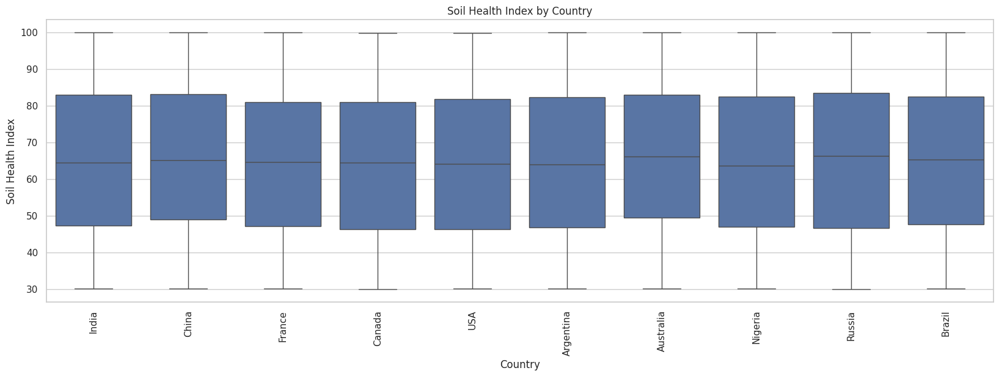

In [275]:
# Box plot to show the distribution of 'Soil_Health_Index' by 'Country'
plt.figure(figsize=(20, 6))
sns.boxplot(x='Country', y='Soil_Health_Index', data=df)
plt.title('Soil Health Index by Country')
plt.xticks(rotation=90)
plt.xlabel('Country')
plt.ylabel('Soil Health Index')
plt.show()

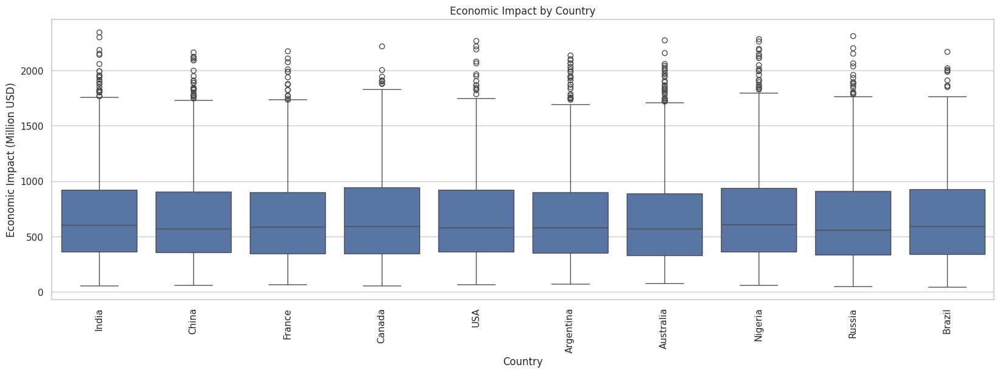

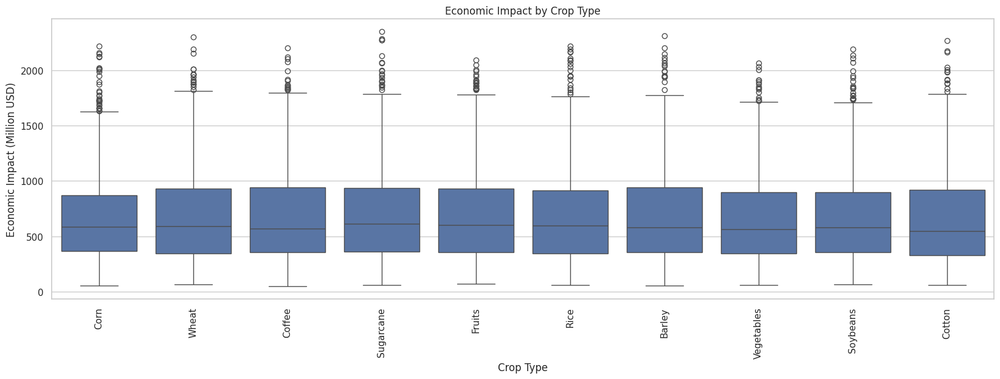

In [276]:
# Box plot to show the distribution of 'Economic_Impact_Million_USD' by 'Country'
plt.figure(figsize=(20, 6))
sns.boxplot(x='Country', y='Economic_Impact_Million_USD', data=df)
plt.title('Economic Impact by Country')
plt.xticks(rotation=90)
plt.xlabel('Country')
plt.ylabel('Economic Impact (Million USD)')
plt.show()

# Box plot to show the distribution of 'Economic_Impact_Million_USD' by 'Crop_Type'
plt.figure(figsize=(20, 6))
sns.boxplot(x='Crop_Type', y='Economic_Impact_Million_USD', data=df)
plt.title('Economic Impact by Crop Type')
plt.xticks(rotation=90)
plt.xlabel('Crop Type')
plt.ylabel('Economic Impact (Million USD)')
plt.show()

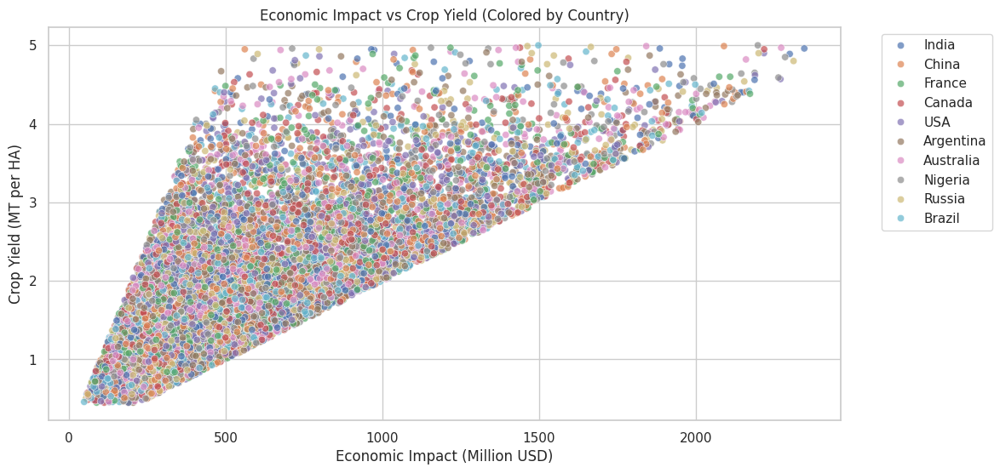

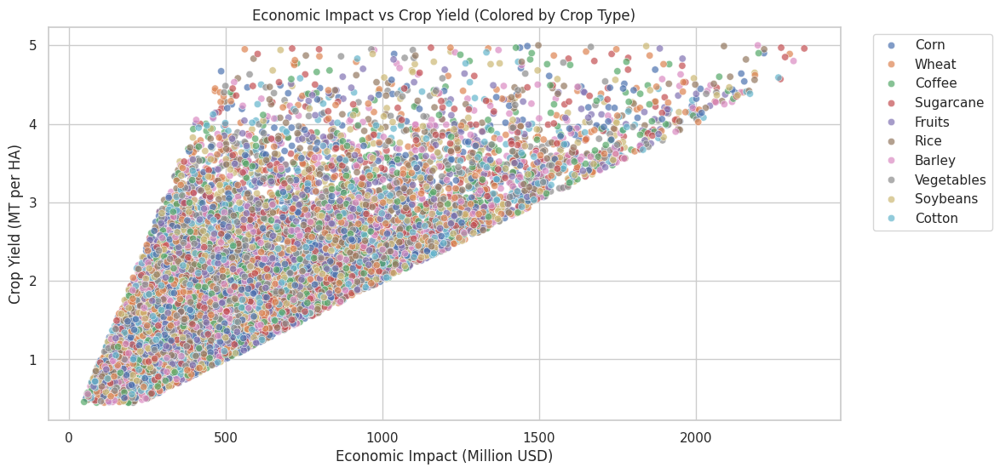

In [277]:
# Scatter plot to show the relationship between 'Economic_Impact_Million_USD' and 'Crop_Yield_MT_per_HA'
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Economic_Impact_Million_USD', y='Crop_Yield_MT_per_HA', hue='Country', data=df, alpha=0.7)
plt.title('Economic Impact vs Crop Yield (Colored by Country)')
plt.xlabel('Economic Impact (Million USD)')
plt.ylabel('Crop Yield (MT per HA)')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

# Scatter plot to show the relationship between 'Economic_Impact_Million_USD' and 'Crop_Yield_MT_per_HA' colored by Crop Type
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Economic_Impact_Million_USD', y='Crop_Yield_MT_per_HA', hue='Crop_Type', data=df, alpha=0.7)
plt.title('Economic Impact vs Crop Yield (Colored by Crop Type)')
plt.xlabel('Economic Impact (Million USD)')
plt.ylabel('Crop Yield (MT per HA)')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

In [278]:
from sklearn.preprocessing import LabelEncoder

# Create a copy of the dataframe to avoid changing the original
df_encoded = df.copy()

# Encode 'Country' and 'Crop_Type' as numeric values
label_encoder = LabelEncoder()
df_encoded['Country'] = label_encoder.fit_transform(df_encoded['Country'])
df_encoded['Crop_Type'] = label_encoder.fit_transform(df_encoded['Crop_Type'])


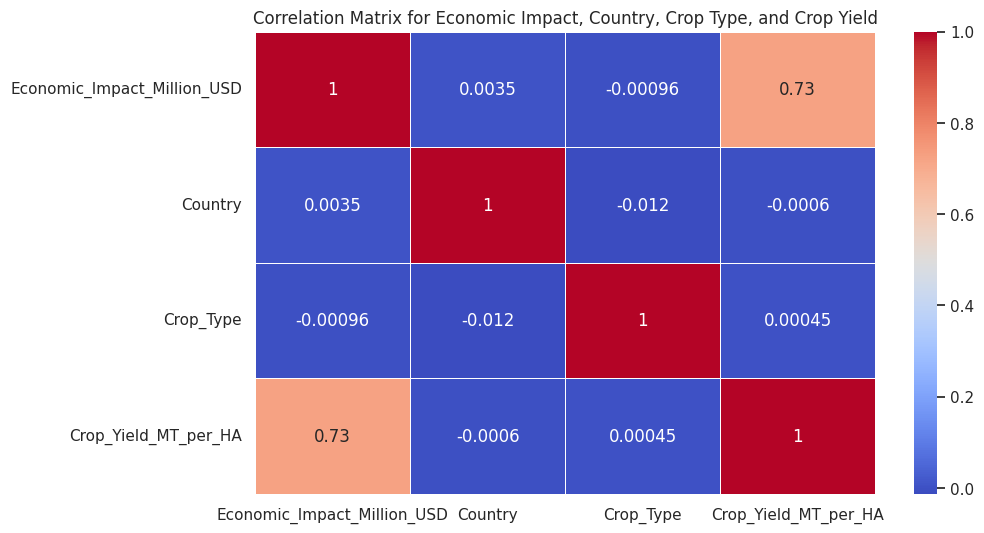

In [279]:
# Select relevant columns for correlation
columns_to_correlate = ['Economic_Impact_Million_USD', 'Country', 'Crop_Type', 'Crop_Yield_MT_per_HA']

# Compute the correlation matrix
correlation_matrix = df_encoded[columns_to_correlate].corr()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Economic Impact, Country, Crop Type, and Crop Yield')
plt.show()

# EDA and Feature Engineering

In [280]:
def impute_outliers(df, column, lower_percentile=5, upper_percentile=95):
    """
    Imputes outliers in a given column based on the lower and upper percentiles.

    Parameters:
    - df: The DataFrame containing the column
    - column: The column in which to impute outliers
    - lower_percentile: The lower bound percentile for capping outliers
    - upper_percentile: The upper bound percentile for capping outliers
    """
    # Calculate the lower and upper percentile thresholds
    lower_bound = df[column].quantile(lower_percentile / 100)
    upper_bound = df[column].quantile(upper_percentile / 100)

    # Impute the outliers: Values below the lower bound become the lower bound,
    # and values above the upper bound become the upper bound.
    df[column] = df[column].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

    print(f"Imputed outliers in '{column}' to within the {lower_percentile}th and {upper_percentile}th percentiles.")

# Apply this function to key columns that might be skewed and have outliers
columns_to_impute = [
    'Total_Precipitation_mm', 'CO2_Emissions_MT', 'Crop_Yield_MT_per_HA',
    'Extreme_Weather_Events', 'Irrigation_Access_%', 'Pesticide_Use_KG_per_HA',
    'Fertilizer_Use_KG_per_HA', 'Soil_Health_Index', 'Economic_Impact_Million_USD'
]

# Impute outliers for each of these columns
for column in columns_to_impute:
    impute_outliers(df, column)


Imputed outliers in 'Total_Precipitation_mm' to within the 5th and 95th percentiles.
Imputed outliers in 'CO2_Emissions_MT' to within the 5th and 95th percentiles.
Imputed outliers in 'Crop_Yield_MT_per_HA' to within the 5th and 95th percentiles.
Imputed outliers in 'Extreme_Weather_Events' to within the 5th and 95th percentiles.
Imputed outliers in 'Irrigation_Access_%' to within the 5th and 95th percentiles.
Imputed outliers in 'Pesticide_Use_KG_per_HA' to within the 5th and 95th percentiles.
Imputed outliers in 'Fertilizer_Use_KG_per_HA' to within the 5th and 95th percentiles.
Imputed outliers in 'Soil_Health_Index' to within the 5th and 95th percentiles.
Imputed outliers in 'Economic_Impact_Million_USD' to within the 5th and 95th percentiles.


In [281]:
# Perform one-hot encoding on the 'Country', 'Region', and 'Crop_Type' columns
df_encoded = pd.get_dummies(df, columns=['Country', 'Region', 'Crop_Type', 'Adaptation_Strategies'], drop_first=True)

# Verify that the encoding was successful
df_encoded.head()

,Year,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Crop_Yield_MT_per_HA,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Economic_Impact_Million_USD,Country_Australia,Country_Brazil,Country_Canada,Country_China,Country_France,Country_India,Country_Nigeria,Country_Russia,Country_USA,Region_Central,Region_East,Region_Grand Est,Region_Ile-de-France,Region_Maharashtra,Region_Midwest,Region_New South Wales,Region_North,Region_North Central,Region_North West,Region_Northeast,Region_Northwest,Region_Northwestern,Region_Nouvelle-Aquitaine,Region_Ontario,Region_Pampas,Region_Patagonia,Region_Prairies,Region_Provence-Alpes-Cote d’Azur,Region_Punjab,Region_Quebec,Region_Queensland,Region_Siberian,Region_South,Region_South East,Region_South West,Region_Southeast,Region_Tamil Nadu,Region_Victoria,Region_Volga,Region_West,Region_West Bengal,Region_Western Australia,Crop_Type_Coffee,Crop_Type_Corn,Crop_Type_Cotton,Crop_Type_Fruits,Crop_Type_Rice,Crop_Type_Soybeans,Crop_Type_Sugarcane,Crop_Type_Vegetables,Crop_Type_Wheat,Adaptation_Strategies_Drought-resistant Crops,Adaptation_Strategies_No Adaptation,Adaptation_Strategies_Organic Farming,Adaptation_Strategies_Water Management
0,2001,1.55,447.060,15.22,1.737,8,14.6900,10.08,14.78,83.25,808.13,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True
1,2024,3.23,2870.141,28.60,1.737,8,14.6900,33.06,23.25,54.02,616.22,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
2,2001,21.11,1301.740,25.75,1.719,5,84.4200,27.41,65.53,67.78,796.96,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True
3,2001,27.85,1154.360,13.91,3.890,5,94.0600,14.38,87.58,91.39,790.32,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False
4,1998,2.19,1627.480,11.81,1.080,9,95.5705,44.35,88.08,49.61,401.72,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False


# Model Building

## Train-Test Split

In [282]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming 'Crop_Yield_MT_per_HA' is the target variable
X = df_encoded.drop(columns=['Crop_Yield_MT_per_HA'])
y = df_encoded['Crop_Yield_MT_per_HA']

# Split the data into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply scaling to the training and test data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


## Scaling (Optional, if needed for certain models)



---



# Model Selection (Starting with Random Forest)

---



In [283]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Fit the model to the training data
rf_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R² Score: {r2}")

Mean Squared Error: 0.3613317279885
R² Score: 0.6146181130052693


# (Hyperparameter Tuning with Random Forest)

In [284]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the grid search to the training data
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
print(f"Best parameters: {grid_search.best_params_}")


Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


In [285]:
# Create a backup of the original DataFrame
df_backup = df.copy()

# Optionally save it to a file for safekeeping
df_backup.to_csv('df_backup.csv', index=False)



---

### Transitioning to PyTorch for Model Building

After successfully tuning the Random Forest model and achieving a satisfactory R² score, the next step involves transitioning to PyTorch for more flexible and customizable model development. PyTorch provides several advantages, such as the ability to construct deep learning models and more granular control over training loops and optimization processes.

In this section, we will:
1. **Prepare the Data**: Convert the training and testing datasets into PyTorch tensors and leverage `DataLoader` for efficient data batching.
2. **Define the Model Architecture**: Create a neural network using PyTorch's `nn.Module` to model the relationship between features and target variables.
3. **Training the Model**: Write custom training loops to handle forward and backward passes, along with loss computation and optimization steps.
4. **Evaluate the Model**: Once trained, we will evaluate the model using metrics such as Mean Squared Error (MSE) and R² score to compare performance with the previous Random Forest model.

This transition will enable us to explore deep learning techniques and fine-tune models more effectively, opening up possibilities for additional performance improvements.

---



# Convert Data into PyTorch Tensors

In [286]:
import torch
from torch.utils.data import DataLoader, TensorDataset

# Convert the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

# Create DataLoader for Batching

In [287]:
# Create TensorDataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Define the Model Architecture

In [288]:
import torch.nn as nn

class CropYieldModel(nn.Module):
    def __init__(self, input_size):
        super(CropYieldModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Initialize the model
model = CropYieldModel(input_size=X_train.shape[1])

# Set Loss Function and Optimizer

In [289]:
# Set the loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error for regression
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)  # Adam optimizer

# Training Loop

In [290]:
# Training loop
epochs = 100
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    # Iterate through the DataLoader
    for inputs, labels in train_loader:
        optimizer.zero_grad()  # Zero the parameter gradients
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    # Print the average loss for the current epoch
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader)}")

Epoch 1/100, Loss: 1.2372952089309692
Epoch 2/100, Loss: 0.4538248040676117
Epoch 3/100, Loss: 0.431847051858902
Epoch 4/100, Loss: 0.4198217966556549
Epoch 5/100, Loss: 0.40779618310928345
Epoch 6/100, Loss: 0.3973621518611908
Epoch 7/100, Loss: 0.38586305499076845
Epoch 8/100, Loss: 0.3810046799182892
Epoch 9/100, Loss: 0.37367972135543825
Epoch 10/100, Loss: 0.37288010704517366
Epoch 11/100, Loss: 0.3710184381008148
Epoch 12/100, Loss: 0.36487582230567933
Epoch 13/100, Loss: 0.36204426193237305
Epoch 14/100, Loss: 0.3601147940158844
Epoch 15/100, Loss: 0.3537346922159195
Epoch 16/100, Loss: 0.34739406180381777
Epoch 17/100, Loss: 0.34105199205875397
Epoch 18/100, Loss: 0.3351589289903641
Epoch 19/100, Loss: 0.3278753807544708
Epoch 20/100, Loss: 0.3207776057720184
Epoch 21/100, Loss: 0.3165026183128357
Epoch 22/100, Loss: 0.3109574486017227
Epoch 23/100, Loss: 0.30606248331069946
Epoch 24/100, Loss: 0.3039514248371124
Epoch 25/100, Loss: 0.29774313771724703
Epoch 26/100, Loss: 0.294

# Model Evaluation

In [291]:
model.eval()
with torch.no_grad():
    test_loss = 0.0
    for inputs, labels in test_loader:
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        test_loss += loss.item()

    print(f"Test Loss: {test_loss/len(test_loader)}")

# Optional: Calculate R² score
from sklearn.metrics import r2_score
y_pred = []
y_true = []

# Collect predictions and true values
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        y_pred.extend(outputs.squeeze().tolist())
        y_true.extend(labels.tolist())

# Compute R² score
r2 = r2_score(y_true, y_pred)
print(f"R² Score: {r2}")

Test Loss: 0.5664505176246166
R² Score: 0.38720606140575276


It seems that while the training loss decreased significantly, the test loss and R² score show that the model is not generalizing well to unseen data. This could indicate **overfitting**, where the model is learning the training data too well but struggling on new data.

### Possible Next Steps:
1. **Regularization**:
   - Add techniques like **dropout** or **weight decay** (L2 regularization) to reduce overfitting.
   
2. **Adjusting Model Complexity**:
   - You could either reduce the size of the network (fewer layers or neurons) or try a different architecture.

3. **Early Stopping**:
   - Use early stopping to prevent overfitting by stopping the training process once the validation loss starts increasing.

4. **Hyperparameter Tuning**:
   - Adjust learning rate, batch size, or other hyperparameters to find the best fit for the data.



# Add Regularization (Dropout and L2 Regularization)

In [292]:
class CropYieldModel(nn.Module):
    def __init__(self, input_size):
        super(CropYieldModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.dropout1 = nn.Dropout(0.3)  # 30% dropout after first layer
        self.fc2 = nn.Linear(64, 32)
        self.dropout2 = nn.Dropout(0.3)  # 30% dropout after second layer
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout1(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

# Reinitialize the model with the updated architecture
model = CropYieldModel(input_size=X_train.shape[1])

# Apply L2 Regularization (Weight Decay)

In [293]:
# Set the loss function and optimizer with weight decay (L2 regularization)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)  # L2 regularization

# Hyperparameter Tuning

In [294]:
learning_rates = [0.001, 0.0001]
dropout_rates = [0.2, 0.3, 0.5]

best_loss = float('inf')
best_model = None

for lr in learning_rates:
    for dr in dropout_rates:
        class CropYieldModel(nn.Module):
            def __init__(self, input_size):
                super(CropYieldModel, self).__init__()
                self.fc1 = nn.Linear(input_size, 64)
                self.dropout1 = nn.Dropout(dr)
                self.fc2 = nn.Linear(64, 32)
                self.dropout2 = nn.Dropout(dr)
                self.fc3 = nn.Linear(32, 1)

            def forward(self, x):
                x = torch.relu(self.fc1(x))
                x = self.dropout1(x)
                x = torch.relu(self.fc2(x))
                x = self.dropout2(x)
                x = self.fc3(x)
                return x

        # Reinitialize the model and optimizer
        model = CropYieldModel(input_size=X_train.shape[1])
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)

        # Training loop
        for epoch in range(50):  # Fewer epochs for faster tuning
            model.train()
            running_loss = 0.0
            for inputs, labels in train_loader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs.squeeze(), labels)
                loss.backward()
                optimizer.step()
                running_loss += loss.item()

            avg_loss = running_loss / len(train_loader)
            if avg_loss < best_loss:
                best_loss = avg_loss
                best_model = model

        print(f"LR: {lr}, Dropout: {dr}, Loss: {avg_loss}")

# After tuning, use `best_model` for evaluation on the test set


LR: 0.001, Dropout: 0.2, Loss: 0.41885921311378477
LR: 0.001, Dropout: 0.3, Loss: 0.4236533100605011
LR: 0.001, Dropout: 0.5, Loss: 0.46322993874549867
LR: 0.0001, Dropout: 0.2, Loss: 0.5052979326248169
LR: 0.0001, Dropout: 0.3, Loss: 0.5723737342357635
LR: 0.0001, Dropout: 0.5, Loss: 0.6989753637313842


# Dropping the Regions Column

In [295]:
df.drop(columns=['Region'], inplace=True)

# Set the best model configuration

In [296]:
# Reinitialize the model with the best configuration
class CropYieldModel(nn.Module):
    def __init__(self, input_size):
        super(CropYieldModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.dropout1 = nn.Dropout(0.2)  # 20% dropout based on best tuning
        self.fc2 = nn.Linear(64, 32)
        self.dropout2 = nn.Dropout(0.2)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout1(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

# Initialize the model with the best learning rate
model = CropYieldModel(input_size=X_train.shape[1])
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)  # L2 regularization

# Reload the best model
model.load_state_dict(best_model.state_dict())

<All keys matched successfully>

# Evaluate on the Test Set

In [297]:
# Evaluate the model on the test set
model.eval()
test_loss = 0.0

with torch.no_grad():
    y_pred = []
    y_true = []
    for inputs, labels in test_loader:
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        test_loss += loss.item()

        y_pred.extend(outputs.squeeze().tolist())
        y_true.extend(labels.tolist())

# Calculate the final test loss and R² score
test_loss /= len(test_loader)
r2 = r2_score(y_true, y_pred)

print(f"Test Loss: {test_loss}")
print(f"R² Score: {r2}")

Test Loss: 0.4273883355781436
R² Score: 0.5406555582105803


# Define a Deeper Neural Network Model

In [298]:
import torch.nn as nn

class DeepCropYieldModel(nn.Module):
    def __init__(self, input_size):
        super(DeepCropYieldModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 32)
        self.fc4 = nn.Linear(32, 1)
        self.dropout = nn.Dropout(0.3)  # Dropout to prevent overfitting

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        return x

# Initialize the model
model = DeepCropYieldModel(input_size=X_train.shape[1])

# Set the Loss Function and Optimizer

In [299]:
# Set the loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)  # L2 regularization

# Train the Model

In [300]:
# Training loop
epochs = 100
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    for inputs, labels in train_loader:
        optimizer.zero_grad()  # Zero the parameter gradients
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss}")

Epoch 1/100, Loss: 1.20518678689003
Epoch 2/100, Loss: 0.5602184038162231
Epoch 3/100, Loss: 0.5274802625179291
Epoch 4/100, Loss: 0.5057611496448516
Epoch 5/100, Loss: 0.48863257813453675
Epoch 6/100, Loss: 0.4658880047798157
Epoch 7/100, Loss: 0.45865233182907106
Epoch 8/100, Loss: 0.4432592611312866
Epoch 9/100, Loss: 0.43515520000457764
Epoch 10/100, Loss: 0.4359468162059784
Epoch 11/100, Loss: 0.42644525742530826
Epoch 12/100, Loss: 0.42033673882484435
Epoch 13/100, Loss: 0.4146886925697327
Epoch 14/100, Loss: 0.4188439096212387
Epoch 15/100, Loss: 0.4121499195098877
Epoch 16/100, Loss: 0.40983865642547607
Epoch 17/100, Loss: 0.41119751942157745
Epoch 18/100, Loss: 0.41089041566848755
Epoch 19/100, Loss: 0.4085070823431015
Epoch 20/100, Loss: 0.40623674654960634
Epoch 21/100, Loss: 0.4057490468025208
Epoch 22/100, Loss: 0.40614350032806396
Epoch 23/100, Loss: 0.40939397311210635
Epoch 24/100, Loss: 0.4070696964263916
Epoch 25/100, Loss: 0.4098861014842987
Epoch 26/100, Loss: 0.404

# Evaluate the Model

In [301]:
model.eval()
test_loss = 0.0
y_pred = []
y_true = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), labels)
        test_loss += loss.item()

        y_pred.extend(outputs.squeeze().tolist())
        y_true.extend(labels.tolist())

test_loss /= len(test_loader)
r2 = r2_score(y_true, y_pred)

print(f"Test Loss: {test_loss}")
print(f"R² Score: {r2}")

Test Loss: 0.4139632601290941
R² Score: 0.5539629966233961


#Steps to Use fastai for Deep Learning
##Install fastai (if not installed)
###Prepare Data for fastai (Tabular data setup)
####Create and Train the Model
#####Evaluate the Model

In [302]:
!pip install fastai

# Convert the DataFrame for fastai

In [303]:
from fastai.tabular.all import *

# Assuming 'Crop_Yield_MT_per_HA' is the target variable
df_fastai = df_encoded.copy()

# Specify the dependent variable (target) and the list of independent variables
dep_var = 'Crop_Yield_MT_per_HA'
indep_vars = list(df_fastai.columns)
indep_vars.remove(dep_var)

# Create a TabularPandas object to prepare the dataset for fastai
dls = TabularDataLoaders.from_df(df_fastai, path='.', y_names=dep_var, cont_names=indep_vars, procs=[Normalize])

# Create and Train the Model

epoch,train_loss,valid_loss,_rmse,time
0,1.640204,0.661534,0.813348,00:01
1,0.560656,0.458197,0.676903,00:01
2,0.430217,0.442742,0.665389,00:01
3,0.368681,0.420244,0.648262,00:01
4,0.343866,0.399589,0.632130,00:01


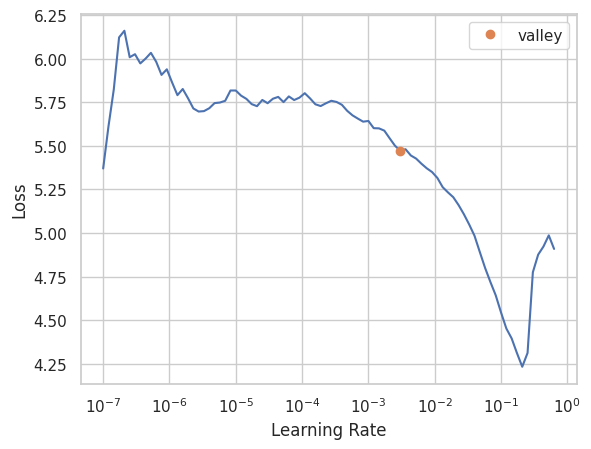

In [304]:
# Create a deep learning model using fastai's TabularLearner
learn = tabular_learner(dls, layers=[200,100], metrics=rmse)

# Find the best learning rate
learn.lr_find()

# Train the model
learn.fit_one_cycle(5, lr_max=1e-2)  # You can adjust the number of epochs and learning rate as needed

# Evaluate the Model

In [305]:
# Evaluate the model's performance on the validation set
learn.show_results()

# Make predictions
preds, targets = learn.get_preds()
r2_score = R2Score()
print(f"R² Score: {r2_score(preds, targets)}")

,Year,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Economic_Impact_Million_USD,Country_Australia,Country_Brazil,Country_Canada,Country_China,Country_France,Country_India,Country_Nigeria,Country_Russia,Country_USA,Region_Central,Region_East,Region_Grand Est,Region_Ile-de-France,Region_Maharashtra,Region_Midwest,Region_New South Wales,Region_North,Region_North Central,Region_North West,Region_Northeast,Region_Northwest,Region_Northwestern,Region_Nouvelle-Aquitaine,Region_Ontario,Region_Pampas,Region_Patagonia,Region_Prairies,Region_Provence-Alpes-Cote d’Azur,Region_Punjab,Region_Quebec,Region_Queensland,Region_Siberian,Region_South,Region_South East,Region_South West,Region_Southeast,Region_Tamil Nadu,Region_Victoria,Region_Volga,Region_West,Region_West Bengal,Region_Western Australia,Crop_Type_Coffee,Crop_Type_Corn,Crop_Type_Cotton,Crop_Type_Fruits,Crop_Type_Rice,Crop_Type_Soybeans,Crop_Type_Sugarcane,Crop_Type_Vegetables,Crop_Type_Wheat,Adaptation_Strategies_Drought-resistant Crops,Adaptation_Strategies_No Adaptation,Adaptation_Strategies_Organic Farming,Adaptation_Strategies_Water Management,Crop_Yield_MT_per_HA,Crop_Yield_MT_per_HA_pred
0,1.290249,0.102598,1.587188,1.283253,1.277646,1.541302,0.274153,-1.424681,1.591555,0.022272,2.939141,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,5.838465,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,2.911815,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,-0.499218,-0.503123,-0.497068,1.969276,2.340,2.573929
1,1.389752,-0.455002,-0.391267,1.047284,0.961387,0.936778,-1.591374,1.135154,-0.386460,-0.528909,-0.340235,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,-0.338403,3.075306,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,6.151008,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,2.999999,-0.328684,-0.334951,-0.337714,-0.346151,2.003130,-0.503123,-0.497068,-0.507801,2.457,1.937617
2,-0.401310,0.835320,-1.119486,-0.772032,-0.619907,-0.905231,0.409407,-0.767823,-0.441265,-1.163849,-0.340235,-0.323759,3.025273,-0.338403,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,6.377038,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,3.038120,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,-0.499218,-0.503123,2.011794,-0.507801,1.150,1.364663
3,-0.202303,0.865813,1.513456,-0.235204,1.277646,-0.905621,-1.397953,0.980141,1.379876,0.088587,-0.340235,-0.323759,-0.330548,-0.338403,3.06645,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,6.499476,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,2.959069,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,2.003130,-0.503123,-0.497068,-0.507801,1.600,2.750319
4,-0.898827,-0.984722,0.192630,0.228474,0.961387,-1.498460,1.570666,1.082775,1.362278,-0.720624,2.9391

R² Score: 0.5489168071602204


# Model Imporvoment

epoch,train_loss,valid_loss,_rmse,time
0,4.966558,3.643317,1.908747,00:01
1,2.112133,0.799654,0.894234,00:01
2,1.124122,0.531835,0.729270,00:01
3,0.856900,0.491474,0.701052,00:01
4,0.809785,0.464517,0.681555,00:01


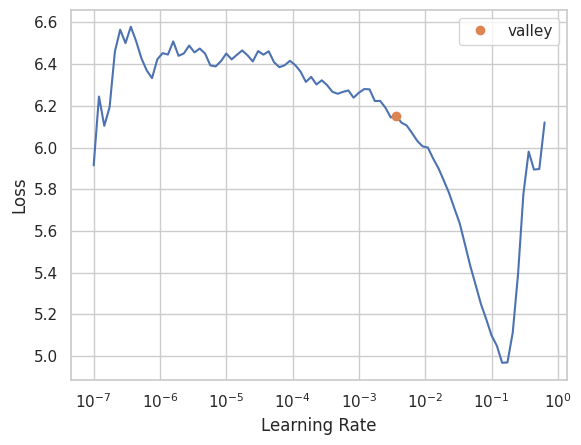

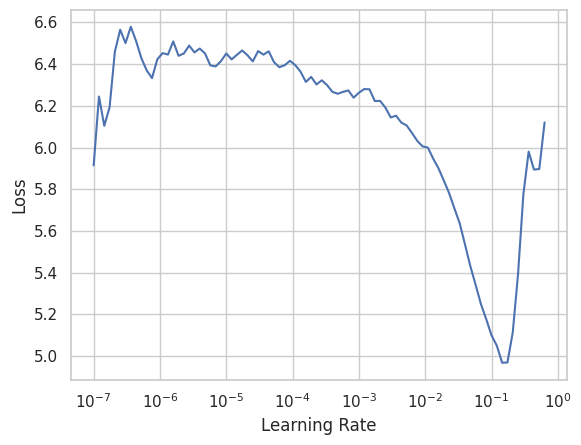

In [306]:
# Define the model configuration, including dropout probabilities
config = tabular_config(ps=[0.5, 0.4])  # Dropout probabilities added here

# Define the deep learning model with added dropout and weight decay
learn = tabular_learner(dls, layers=[400, 200], metrics=rmse, wd=0.01, config=config)

# Find the best learning rate
learn.lr_find()
learn.recorder.plot_lr_find()

# Train the model with differential learning rates (unfreezing the model)
learn.fit_one_cycle(5, lr_max=slice(1e-5, 1e-3))


# Show the Results

In [307]:
# Show the results of the predictions compared to the actual values
learn.show_results()

,Year,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Economic_Impact_Million_USD,Country_Australia,Country_Brazil,Country_Canada,Country_China,Country_France,Country_India,Country_Nigeria,Country_Russia,Country_USA,Region_Central,Region_East,Region_Grand Est,Region_Ile-de-France,Region_Maharashtra,Region_Midwest,Region_New South Wales,Region_North,Region_North Central,Region_North West,Region_Northeast,Region_Northwest,Region_Northwestern,Region_Nouvelle-Aquitaine,Region_Ontario,Region_Pampas,Region_Patagonia,Region_Prairies,Region_Provence-Alpes-Cote d’Azur,Region_Punjab,Region_Quebec,Region_Queensland,Region_Siberian,Region_South,Region_South East,Region_South West,Region_Southeast,Region_Tamil Nadu,Region_Victoria,Region_Volga,Region_West,Region_West Bengal,Region_Western Australia,Crop_Type_Coffee,Crop_Type_Corn,Crop_Type_Cotton,Crop_Type_Fruits,Crop_Type_Rice,Crop_Type_Soybeans,Crop_Type_Sugarcane,Crop_Type_Vegetables,Crop_Type_Wheat,Adaptation_Strategies_Drought-resistant Crops,Adaptation_Strategies_No Adaptation,Adaptation_Strategies_Organic Farming,Adaptation_Strategies_Water Management,Crop_Yield_MT_per_HA,Crop_Yield_MT_per_HA_pred
0,-0.401310,0.445871,-0.233493,-0.978504,0.645128,-0.099328,1.570666,1.484817,0.574894,0.692573,2.939141,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.176240,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,5.838465,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,2.961082,-0.346151,-0.499218,-0.503123,2.011794,-0.507801,2.340,2.645329
1,0.394718,-0.480268,-1.591058,1.573494,-0.303648,-1.591554,-1.325070,1.113211,0.604559,0.704896,-0.340235,3.088718,-0.330548,-0.338403,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,4.258960,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.176240,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,2.961082,-0.346151,-0.499218,-0.503123,-0.497068,-0.507801,1.989,2.767068
2,-0.799324,0.411021,-0.615472,-1.234530,-0.303648,-1.118295,-0.836613,-0.696687,-0.519702,1.780739,-0.340235,-0.323759,-0.330548,-0.338403,-0.32611,2.983452,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,5.674062,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,3.08423,-0.337944,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,-0.499218,-0.503123,-0.497068,-0.507801,3.020,3.173294
3,0.892235,-1.023057,-1.591058,-0.578538,-0.303648,-1.169711,0.890155,1.196026,1.157639,0.849190,-0.340235,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,2.955056,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,6.061007,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.176240,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,2.911815,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,2.003130,-0.503123,-0.497068,-0.507801,2.457,2.766654
4,0.295214,1.233481,0.278500,-1.175538,1.593905,-1.374595,-1.591374,-0.007977,1.591555,-0.03

# Get Predictions and Calculate R² Score

In [308]:
# Get predictions and targets from the validation set
preds, targets = learn.get_preds()

# Calculate the R² score
r2 = R2Score()
print(f"R² Score: {r2(preds, targets)}")

R² Score: 0.47562116879244354


# Optionally Check the Loss on the Test Set

In [309]:
# Get validation set loss and accuracy
val_loss = learn.validate()[1]  # This will return the validation loss
print(f"Validation Loss: {val_loss}")

Validation Loss: 0.6815547943115234


# Train the Model with the Selected Learning Rate
Based on the plot,
10
−2
  seems like a good maximum learning rate to start with.

In [310]:
# Train the model with the chosen learning rate from the lr_find plot
learn.fit_one_cycle(5, lr_max=1e-2)  # Train for 5 epochs with the learning rate around 10^-2


epoch,train_loss,valid_loss,_rmse,time
0,0.753192,0.570063,0.755025,00:01
1,0.538768,0.453167,0.673177,00:01
2,0.466866,0.406621,0.637668,00:01
3,0.430846,0.374401,0.611883,00:01
4,0.421222,0.369367,0.607756,00:01


# Evaluate the Model

In [311]:
# Show results and evaluate on the validation set
learn.show_results()

# Get predictions and calculate R² score
preds, targets = learn.get_preds()
r2 = R2Score()
print(f"R² Score: {r2(preds, targets)}")

,Year,Average_Temperature_C,Total_Precipitation_mm,CO2_Emissions_MT,Extreme_Weather_Events,Irrigation_Access_%,Pesticide_Use_KG_per_HA,Fertilizer_Use_KG_per_HA,Soil_Health_Index,Economic_Impact_Million_USD,Country_Australia,Country_Brazil,Country_Canada,Country_China,Country_France,Country_India,Country_Nigeria,Country_Russia,Country_USA,Region_Central,Region_East,Region_Grand Est,Region_Ile-de-France,Region_Maharashtra,Region_Midwest,Region_New South Wales,Region_North,Region_North Central,Region_North West,Region_Northeast,Region_Northwest,Region_Northwestern,Region_Nouvelle-Aquitaine,Region_Ontario,Region_Pampas,Region_Patagonia,Region_Prairies,Region_Provence-Alpes-Cote d’Azur,Region_Punjab,Region_Quebec,Region_Queensland,Region_Siberian,Region_South,Region_South East,Region_South West,Region_Southeast,Region_Tamil Nadu,Region_Victoria,Region_Volga,Region_West,Region_West Bengal,Region_Western Australia,Crop_Type_Coffee,Crop_Type_Corn,Crop_Type_Cotton,Crop_Type_Fruits,Crop_Type_Rice,Crop_Type_Soybeans,Crop_Type_Sugarcane,Crop_Type_Vegetables,Crop_Type_Wheat,Adaptation_Strategies_Drought-resistant Crops,Adaptation_Strategies_No Adaptation,Adaptation_Strategies_Organic Farming,Adaptation_Strategies_Water Management,Crop_Yield_MT_per_HA,Crop_Yield_MT_per_HA_pred
0,0.792732,1.587209,1.520036,-1.570785,-1.568683,-1.444707,-1.440001,-0.798260,1.058587,-0.789129,-0.340235,-0.323759,3.025273,-0.338403,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,6.343269,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,2.003130,-0.503123,-0.497068,-0.507801,1.870,1.873572
1,0.096207,-1.719186,0.420919,0.109310,-0.936166,0.985467,-1.405662,1.580462,0.876574,0.005093,-0.340235,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,-0.338403,3.075306,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,6.261066,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,-0.333333,3.042434,-0.334951,-0.337714,-0.346151,-0.499218,-0.503123,-0.497068,-0.507801,2.403,1.944595
2,-0.301806,-1.375914,1.587188,0.361796,0.645128,-0.831224,-0.837314,1.124183,0.610089,0.301782,-0.340235,-0.323759,-0.330548,2.955056,-0.32611,-0.335182,-0.338403,-0.325171,-0.344791,-0.218646,5.932879,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,-0.164989,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,-0.32423,-0.337944,-0.343428,-0.329151,2.999999,-0.328684,-0.334951,-0.337714,-0.346151,2.003130,-0.503123,-0.497068,-0.507801,1.593,2.180789
3,0.792732,-1.338450,0.445248,-1.213293,-0.619907,-1.055583,-0.974671,-1.584684,-0.421656,1.706692,-0.340235,-0.323759,-0.330548,-0.338403,-0.32611,-0.335182,2.955056,-0.325171,-0.344791,-0.218646,-0.168552,-0.160128,-0.153858,-0.14646,-0.163786,-0.165388,-0.234799,-0.158063,6.061007,-0.288577,-0.156393,-0.152147,-0.159717,-0.160947,-0.153858,-0.160128,-0.157647,-0.153858,-0.17624,-0.156812,-0.162169,-0.159717,-0.290099,-0.162979,-0.163383,-0.147348,-0.157647,-0.171278,-0.162575,-0.160947,-0.162169,-0.153432,3.08423,-0.337944,-0.343428,-0.329151,-0.333333,-0.328684,-0.334951,-0.337714,-0.346151,-0.499218,-0.503123,-0.497068,-0.507801,2.970,3.093186
4,0.295214,0.823122,1.129927,-1.013900,1.593905,0.603744,1.544001,-0.561140,0.147514,-0.725189,-0

R² Score: 0.5830325550372826
